In [5]:
install.packages("ggplot2")
library(ggplot2)

if (!require("igraph")) install.packages("igraph")
library ("igraph")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
fb_combined <- read.table("facebook_combined.txt")
tmp_mat <- as.matrix(fb_combined)+1
g <- graph.edgelist(tmp_mat,directed=FALSE) #read the graph 

is.connected(g)
diameter(g)         

[1] TRUE

[1] 8

## Question 1.0 : A first look at the network

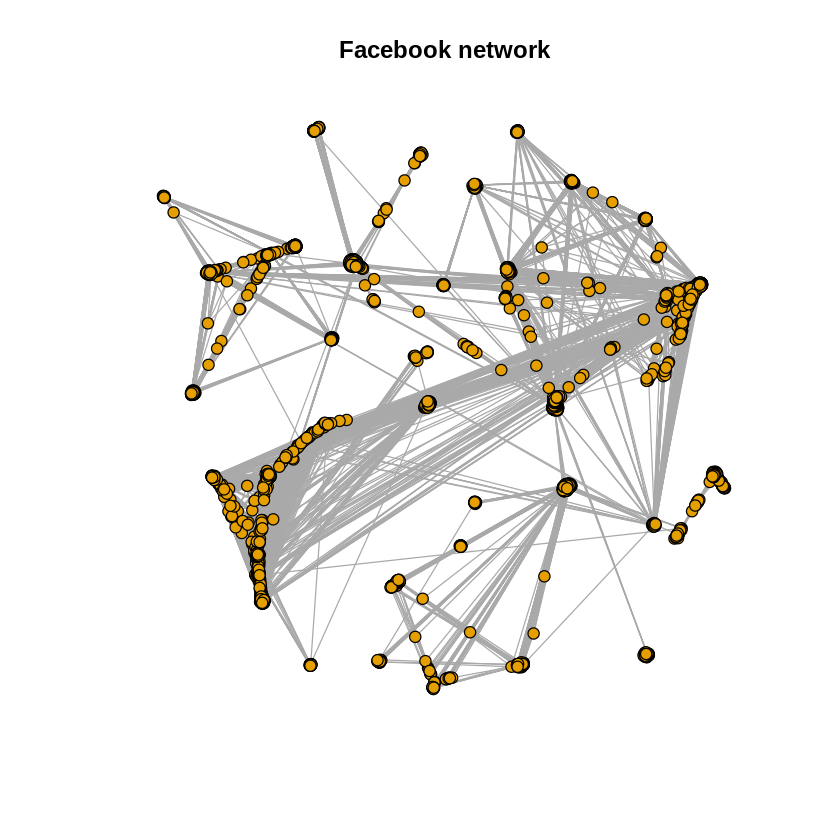

In [ ]:

plot(g, edge.arrow.size=.1, vertex.size=4, vertex.label=NA, main="Facebook network")

## Question 1.1 : Number of nodes and number of edges of the Facebook network

In [ ]:

sprintf('Number of nodes: %s',vcount(g))
sprintf('Number of edges: %s',ecount(g))

[1] "Number of nodes: 4039"

[1] "Number of edges: 88234"

## Question 1.2: Is the facebook network connected ?

In [ ]:
print(paste("Network connected: ", is_connected(g)))

[1] "Network connected:  TRUE"


## Question 2: Diameter of the network 

In [ ]:
print(paste("Network diameter: ", diameter(g)))

[1] "Network diameter:  8"


## Question 3: Degree distribution  of the network 

[1] "Average network degree:  522.5"


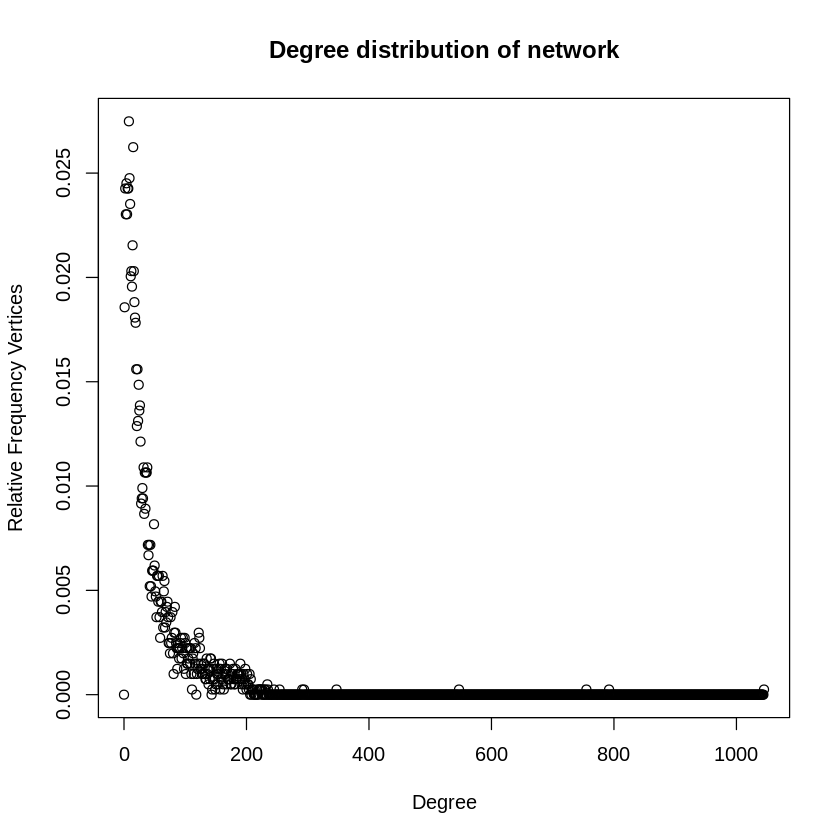

In [ ]:
unique_degrees = unique(sort(degree(g)))
if (unique_degrees[1]!=0) {
    unique_degrees = seq(0,max(unique_degrees))
}
dd = degree_distribution(g)

plot(unique_degrees, dd, main="Degree distribution of network", xlab="Degree", ylab="Relative Frequency Vertices")
print(paste("Average network degree: ", mean(unique_degrees)))

## Question 4: Degree distribution  of the network in log-log scale

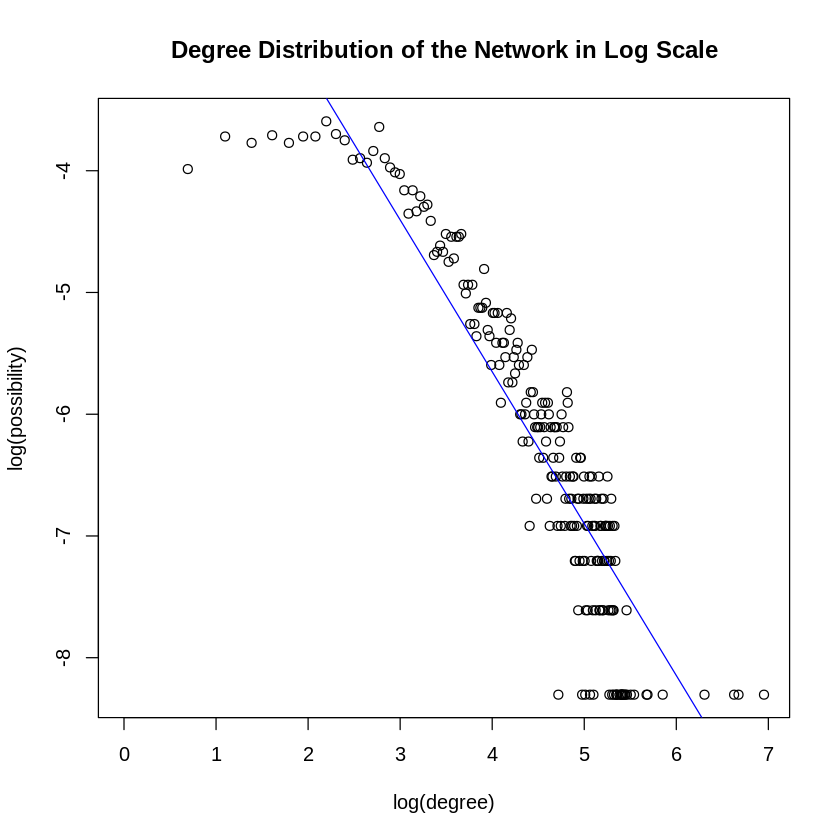

In [ ]:
log_degree = log(c(1:length(degree.distribution(g))))
log_distr = log(degree.distribution(g))

log_degree_x = log_degree[-which(is.infinite(log_distr))]
log_distr_y = log_distr[-which(is.infinite(log_distr))]

plot(log_degree, log_distr, main="Degree Distribution of the Network in Log Scale",xlab="log(degree)",ylab="log(possibility)")
abline(lm(log_distr_y~log_degree_x), col="blue")

## Question 5: Create a personalized network of the user whose ID is 1. How many nodes and  edges does this personalized network have?

[1] "Network ID 1 number of nodes:  348"
[1] "Network ID 1 number of edges:  2866"


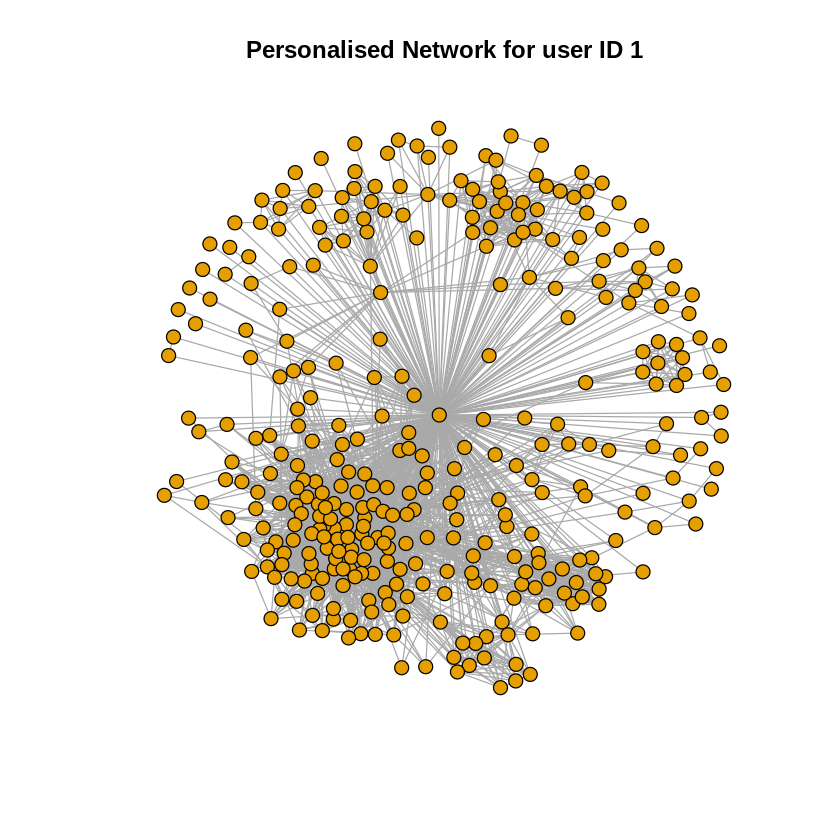

In [ ]:
g1 = make_ego_graph(g, order=1,nodes=c('1'))[[1]]
test <- plot(g1, edge.arrow.size=.1, vertex.size=5, vertex.label=NA,main="Personalised Network for user ID 1")

print(paste("Network ID 1 number of nodes: ", vcount(g1)))
print(paste("Network ID 1 number of edges: ", ecount(g1)))

## Question 6: What is the diameter of the personalized network? Please state a trivial upper  and lower bound for the diameter of the personalized network.

In [ ]:
print(paste("Network ID 1 diameter: ", diameter(g1)))


[1] "Network ID 1 diameter:  2"


## Question 7 In the context of the personalized network, what is the meaning of the diameter of the personalized network to be equal to the upper bound you derived in Question 6. What is the  meaning of the diameter of the personalized network to be equal to the lower bound you derived in Question 6?

**QUESTION 8: How many core nodes are there in the Facebook network. What is the average degree of the core nodes?**

In [ ]:
#Average degree of the core nodes
facebook_net = g
core_nodes = c()

for (i in degree(facebook_net)){
  if (i > 200) {
    core_nodes = c(core_nodes, i)
  }
}

print(paste('Number of core nodes:', length(core_nodes)))
print(paste('Average Degree:', mean(core_nodes)))

[1] "Number of core nodes: 40"
[1] "Average Degree: 279.375"


## Q9

**QUESTION 9:** For each of the above core node’s personalized network, find the community structure using Fast-Greedy, Edge-Betweenness, and Infomap community detection algorithms. Compare the modularity scores of the algorithms. For visualization purpose, display the community structure of the core node’s personalized networks using colors. Nodes belonging to the same community should have the same color and nodes belonging to different communities should have different color. In this question, you should have 15 plots in total.

*Useful function(s): cluster_fast_greedy , cluster_edge_betweenness , cluster_infomap*

In [ ]:
#write helper function for community dection algorithms
community_detect = function(g, node_id) {
  fg <- fastgreedy.community(g)
  eb <- edge.betweenness.community(g)
  info_map <- infomap.community(g)

  cat("Node:", node_id, "\n") #make print output separator
  print(sprintf('Fast-Greedy Modularity Node %s is %s', node_id, modularity(fg)))
  print(sprintf('Edge-Betweenness Modularity Node %s is %s', node_id, modularity(eb)))
  print(sprintf('Info Map Modularity Node %s is %s', node_id, modularity(info_map)))
 
  #jpeg(paste0(node_id, '_q9_fg.jpeg'))
  plot(g, mark.groups = groups(fg), edge.arrow.size=0.1, vertex.color=fg$membership, vertex.size=5, vertex.label = NA, main=sprintf("Fast-Greedy; Core Node: %s", node_id))
  #dev.off()

  #jpeg(paste0(node_id, '_q9_eb.jpeg'))
  plot(g, mark.groups = groups(eb), edge.arrow.size=0.1, vertex.color=eb$membership, vertex.size=5, vertex.label = NA, main=sprintf("Edge-Betweenness; Core Node: %s", node_id))
  #dev.off()

  #jpeg(paste0(node_id, '_q9_im.jpeg'))
  plot(g, mark.groups = groups(info_map), edge.arrow.size=0.1, vertex.color=info_map$membership, vertex.size=5, vertex.label = NA, main=sprintf("Info Map; Core Node: %s", node_id))
  #dev.off()
  cat('\n')
}

Node: 1 
[1] "Fast-Greedy Modularity Node 1 is 0.413101372834235"
[1] "Edge-Betweenness Modularity Node 1 is 0.353302172546335"
[1] "Info Map Modularity Node 1 is 0.389118471050977"


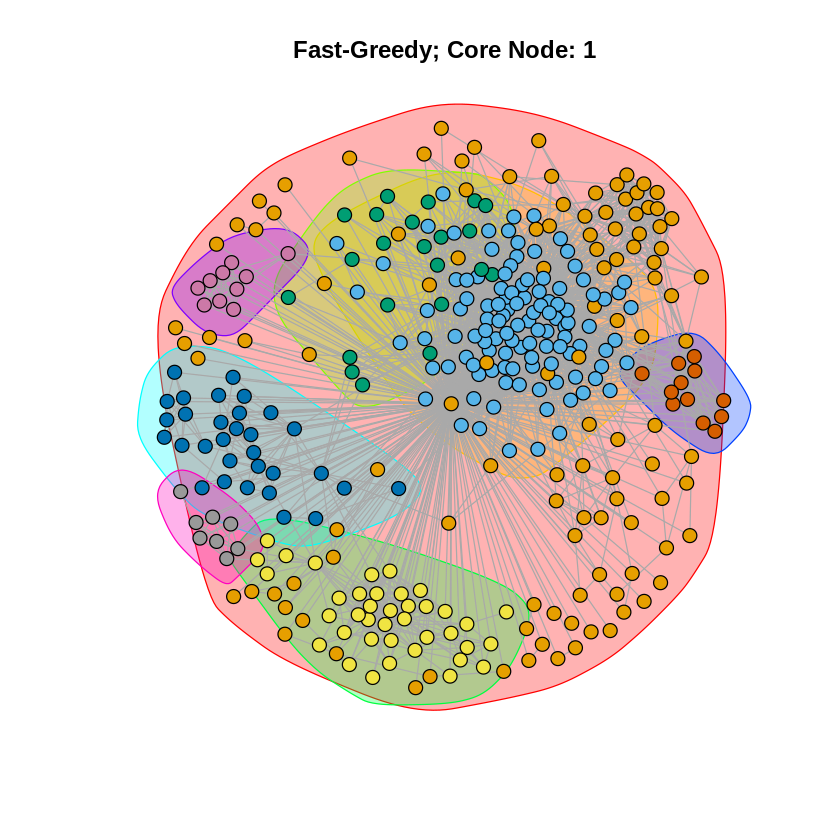

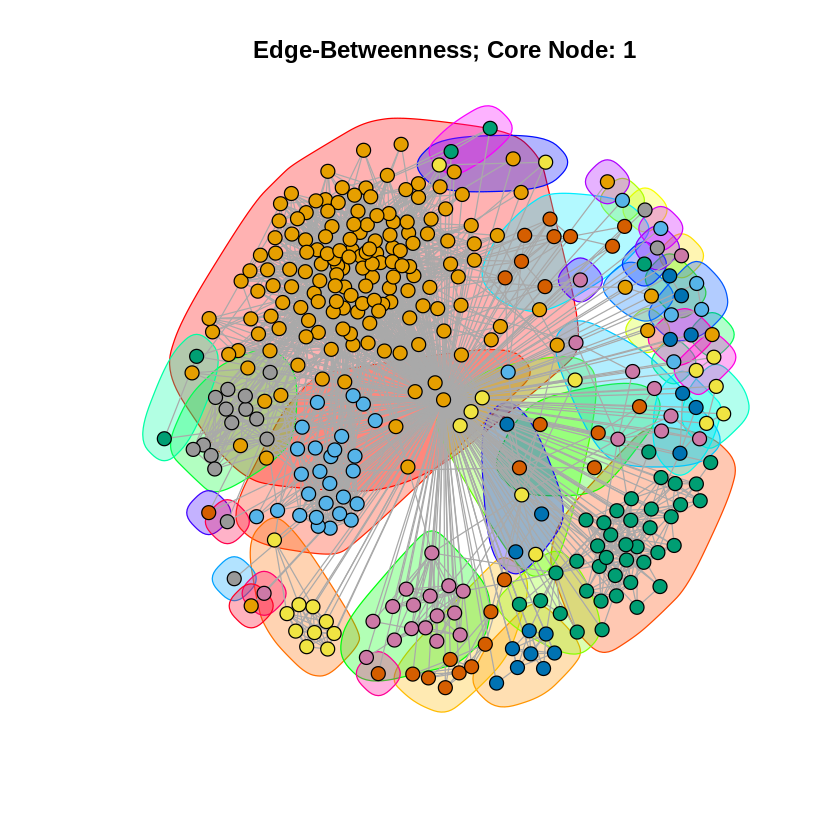

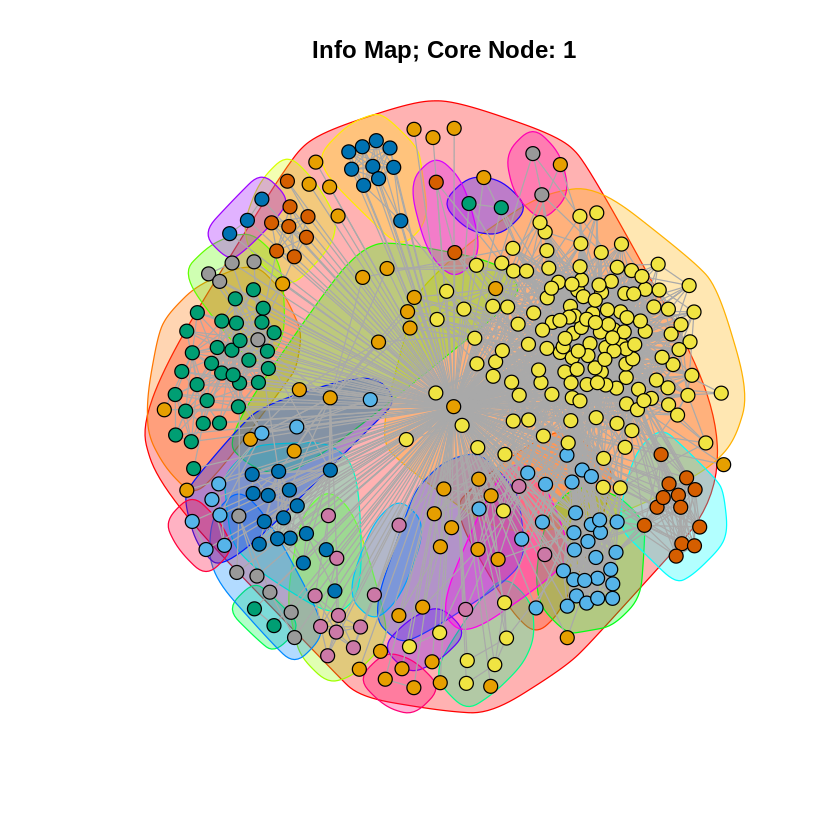

In [ ]:
#q9 node 1
community_detect(induced.subgraph(g, c(1, neighbors(g,1))), 1)

In [ ]:
#q9 node 349
community_detect(induced.subgraph(g, c(108, neighbors(g,108))), 108)

Node: 349 
[1] "Fast-Greedy Modularity Node 349 is 0.251714858543331"
[1] "Edge-Betweenness Modularity Node 349 is 0.133528021370078"
[1] "Info Map Modularity Node 349 is 0.203752997872299"


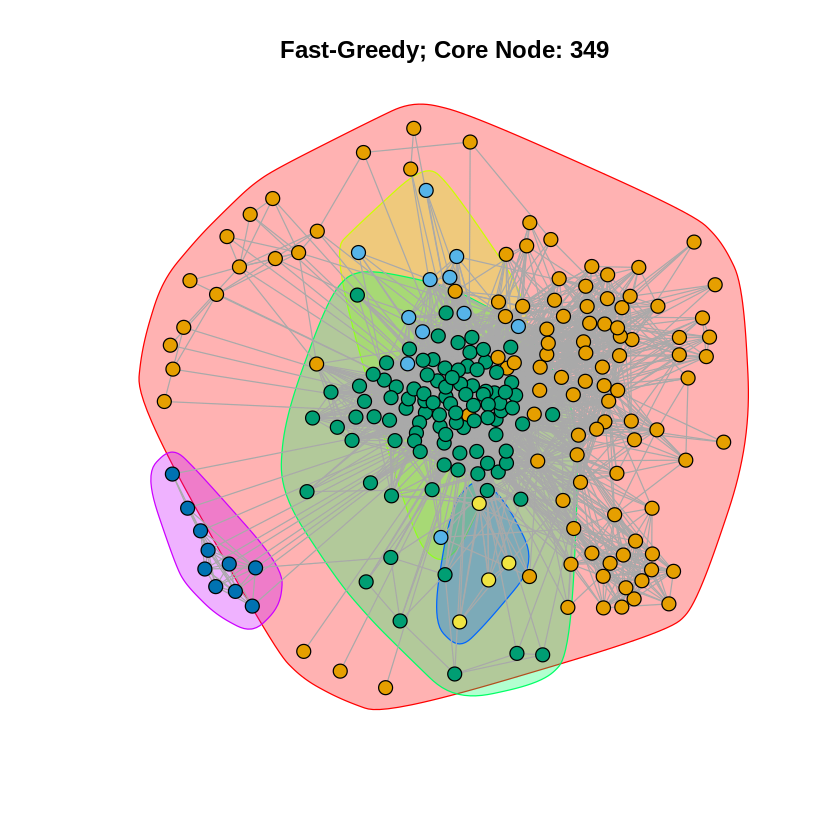

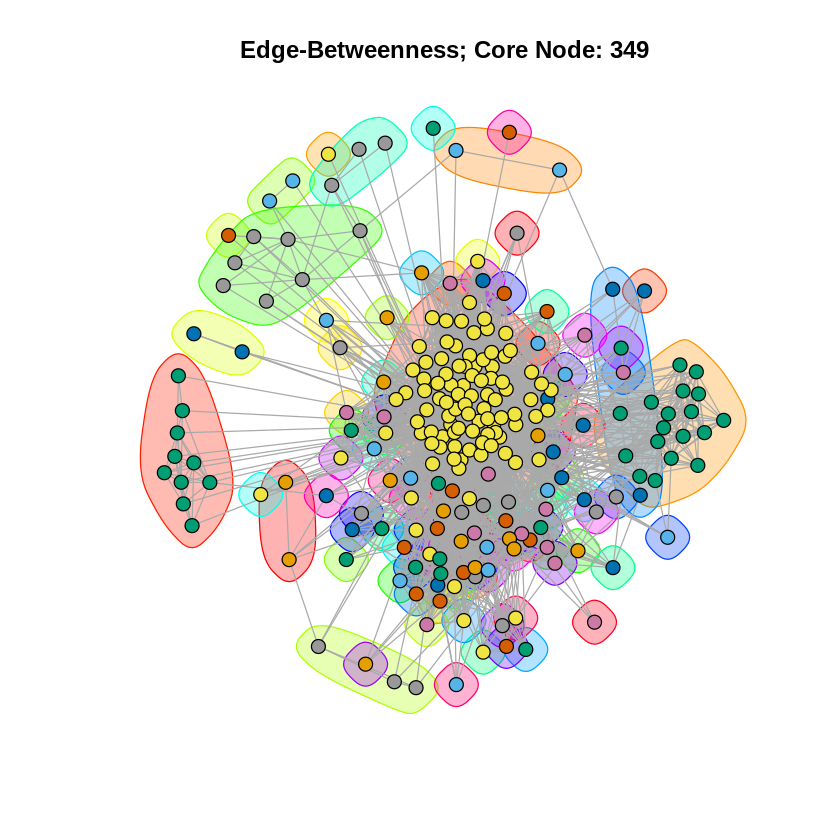

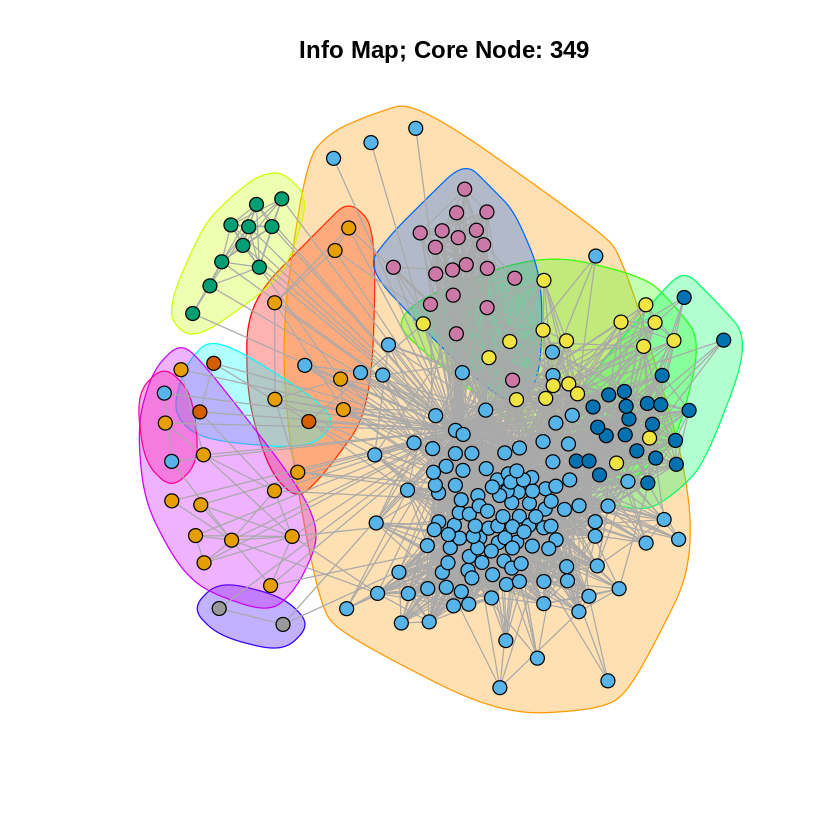

In [ ]:
#q9 node 349
community_detect(induced.subgraph(g, c(349, neighbors(g,349))), 349)

Node: 484 
[1] "Fast-Greedy Modularity Node 484 is 0.507001642196514"
[1] "Edge-Betweenness Modularity Node 484 is 0.489095180244803"
[1] "Info Map Modularity Node 484 is 0.515278752174842"


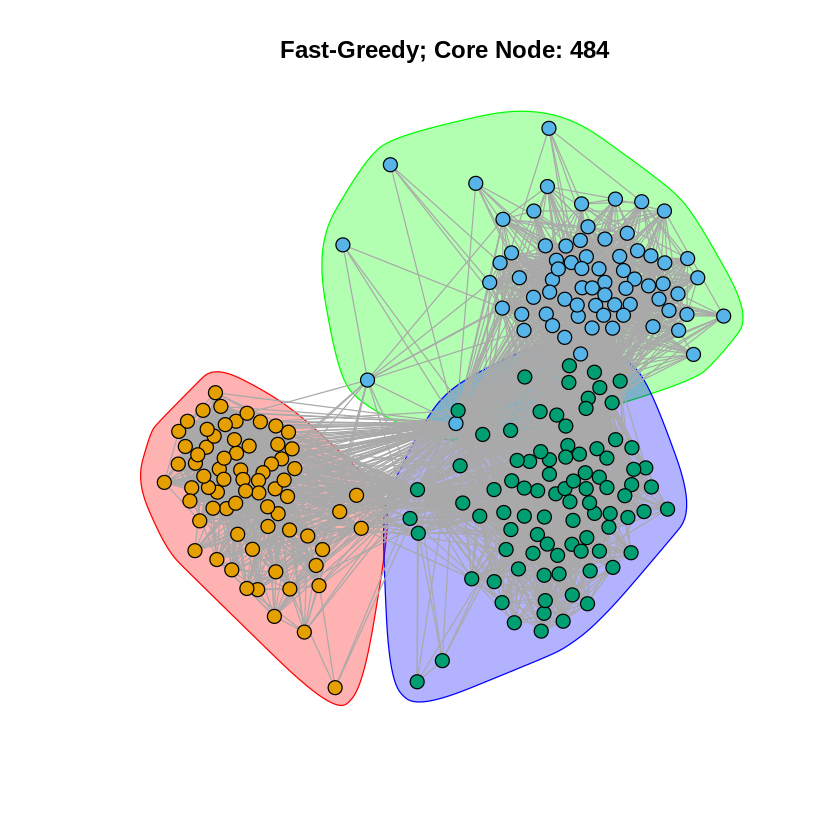

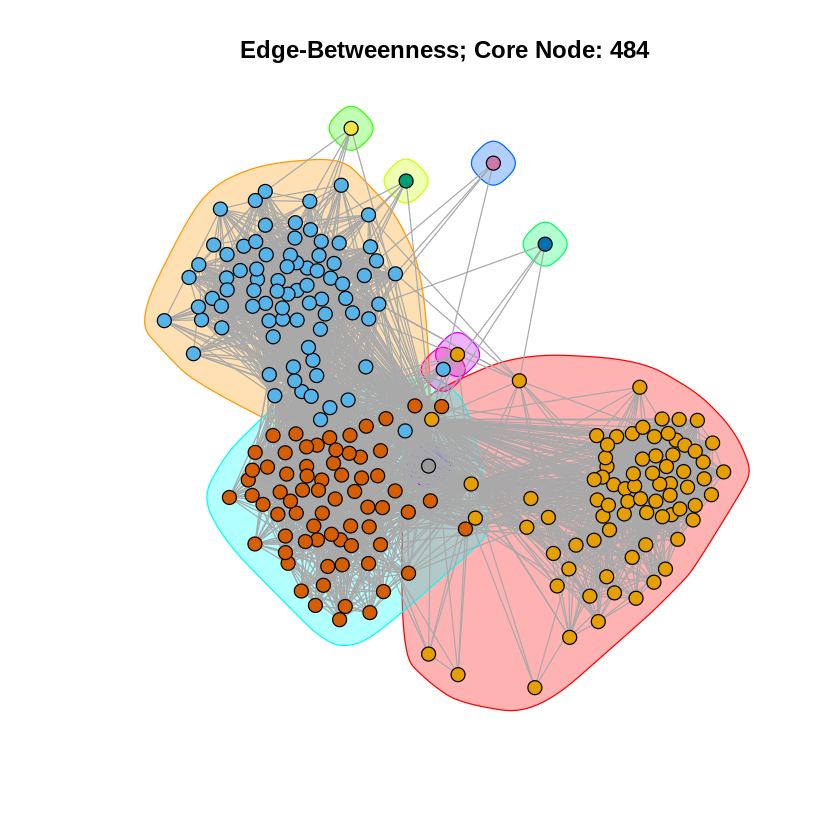

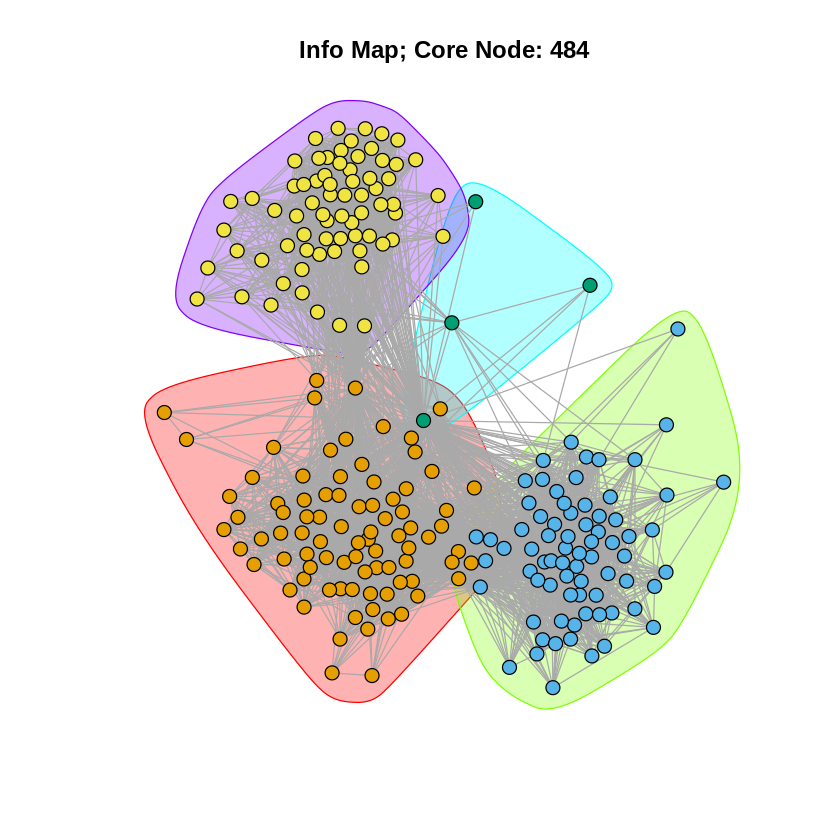

In [ ]:
#q9 node 484
community_detect(induced.subgraph(g, c(484, neighbors(g,484))), 484)

Node: 1087 
[1] "Fast-Greedy Modularity Node 1087 is 0.145531499565493"
[1] "Edge-Betweenness Modularity Node 1087 is 0.0276237723884639"
[1] "Info Map Modularity Node 1087 is 0.0269066172233356"


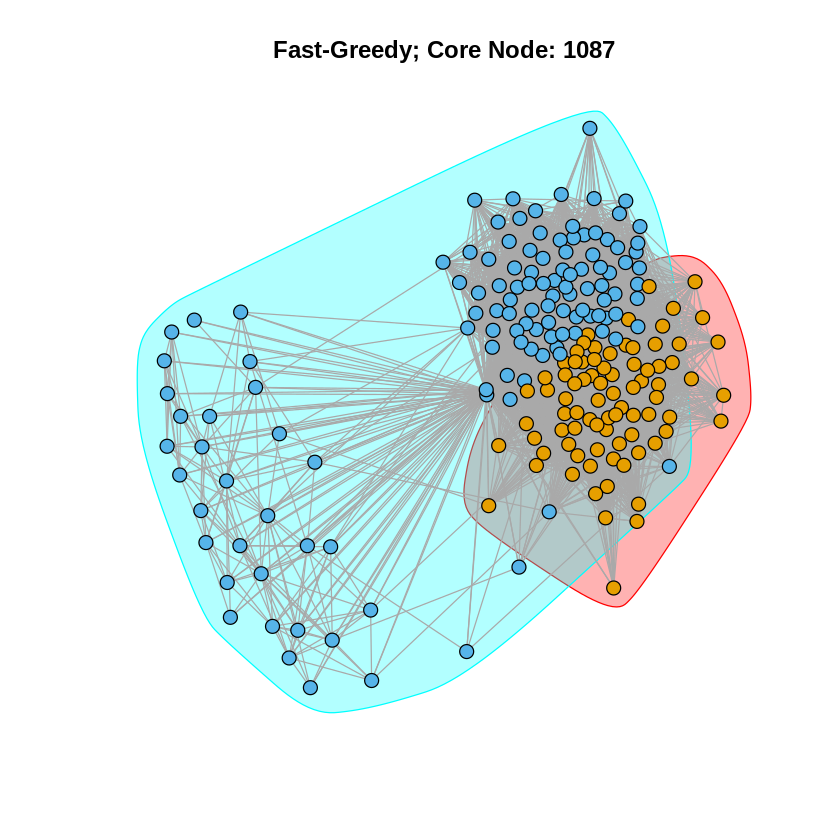

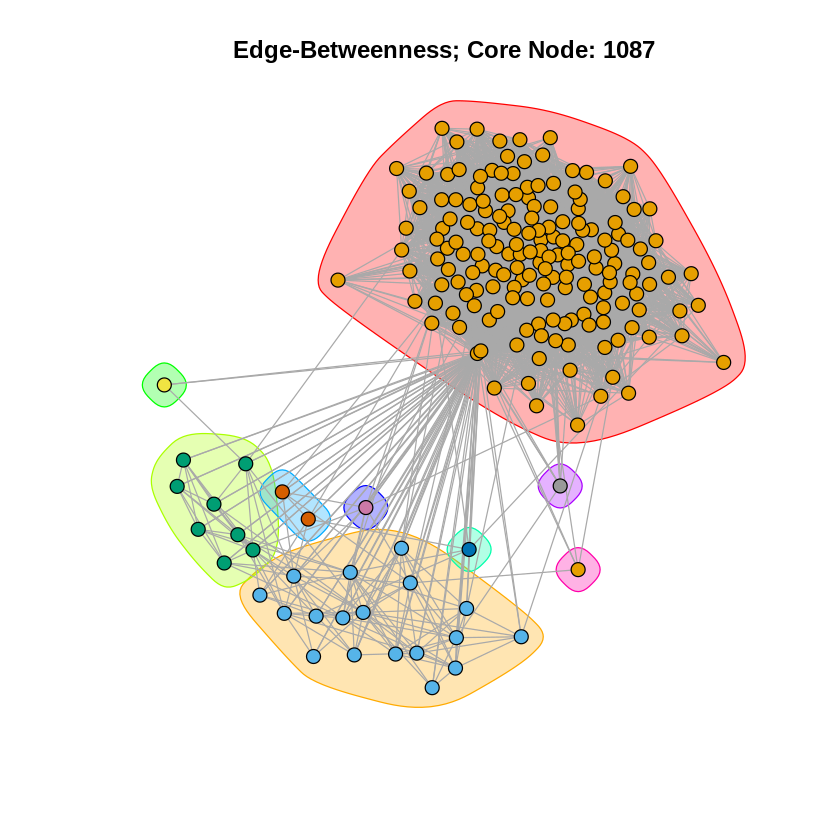

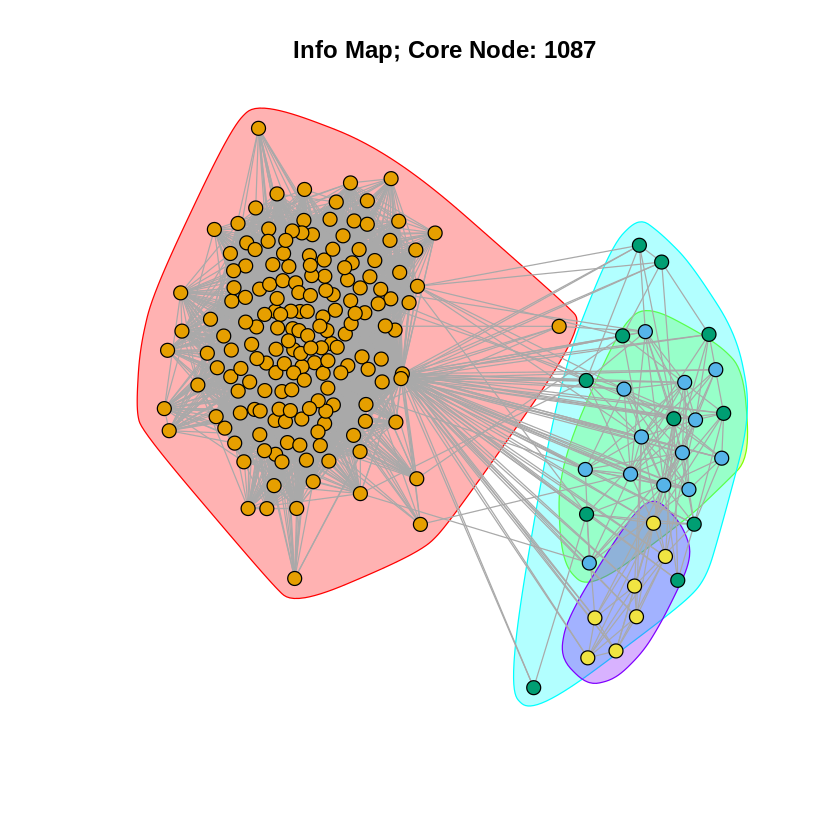

In [ ]:
#q9 node 1087
community_detect(induced.subgraph(g, c(1087, neighbors(g,1087))), 1087)

## Q 10

**QUESTION 10:** For each of the core node’s personalized network (use same core nodes as
Question 9), remove the core node from the personalized network and find the community structure
of the modified personalized network. Use the same community detection algorithm as Question 9.
Compare the modularity score of the community structure of the modified personalized network with
the modularity score of the community structure of the personalized network of Question 9. For
visualization purpose, display the community structure of the modified personalized network using
colors. In this question, you should have 15 plots in total.

Node: 1 
[1] "Fast-Greedy Modularity Node 1 is 0.44185326886839"
[1] "Edge-Betweenness Modularity Node 1 is 0.41614614203983"
[1] "Info Map Modularity Node 1 is 0.418007659453891"


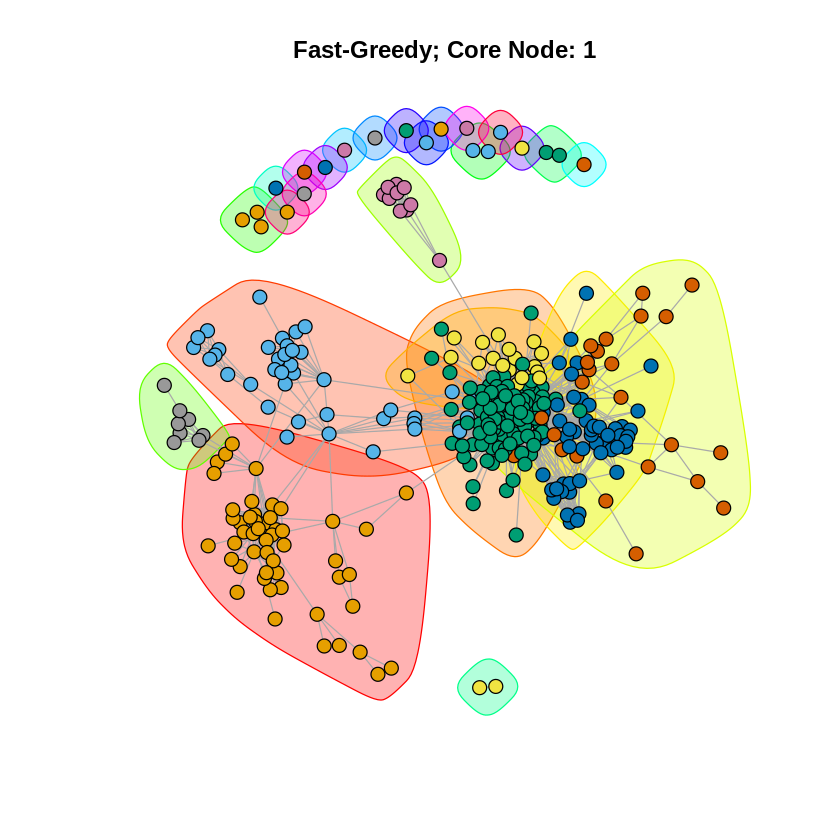

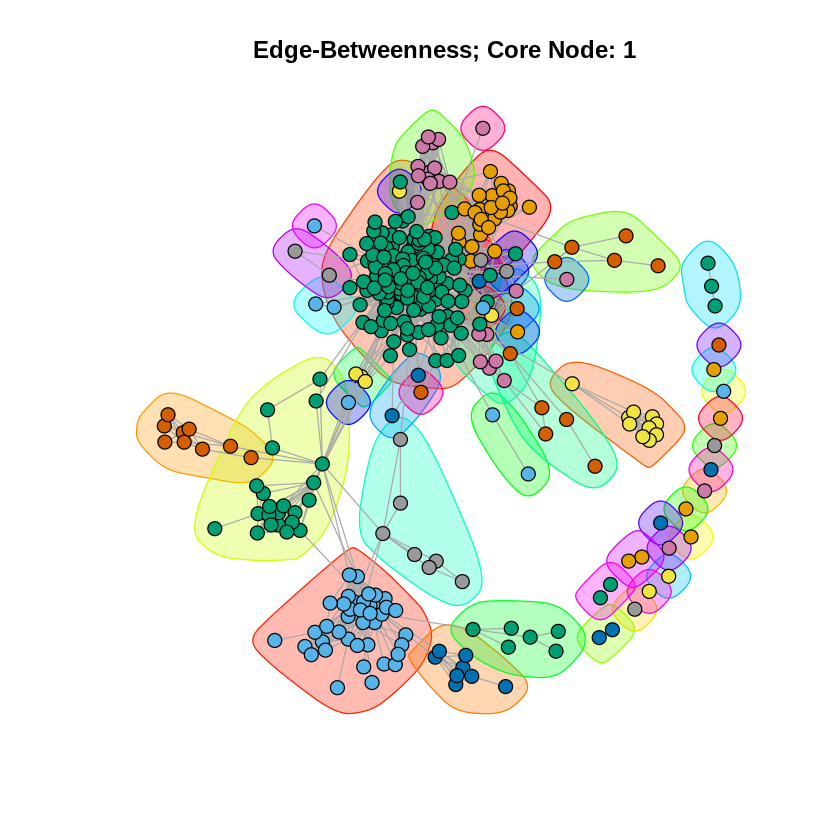

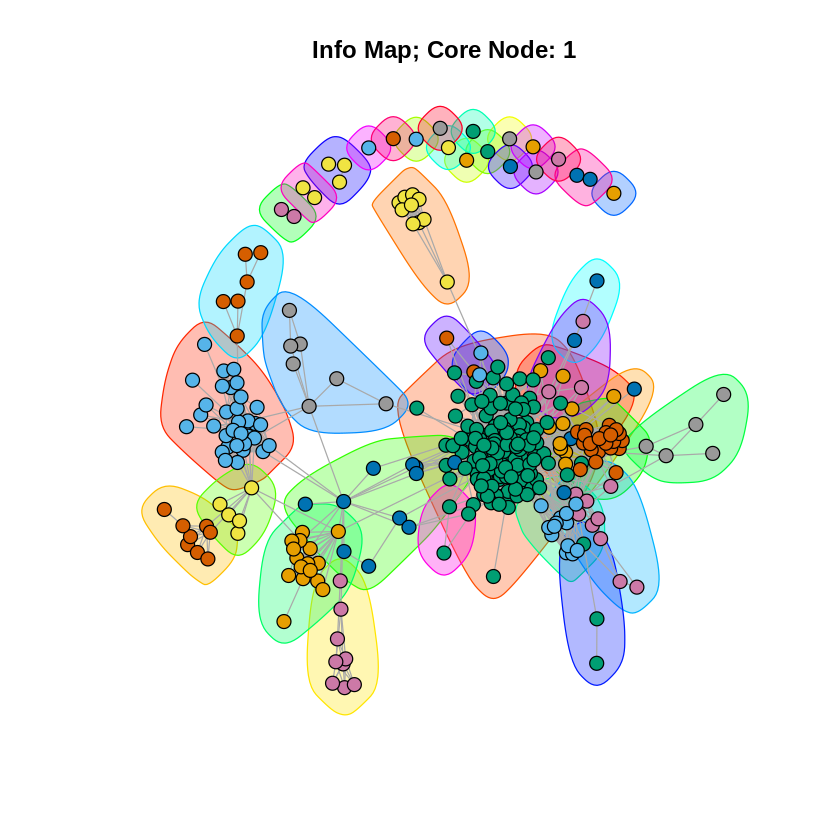

In [ ]:
#q10 node 1
community_detect(induced.subgraph(g, neighbors(g,1)), 1)

In [ ]:
#q10 node 108
community_detect(induced.subgraph(g, neighbors(g,108)), 108)

Node: 349 
[1] "Fast-Greedy Modularity Node 349 is 0.245691795942674"
[1] "Edge-Betweenness Modularity Node 349 is 0.150566340187559"
[1] "Info Map Modularity Node 349 is 0.246578492623397"


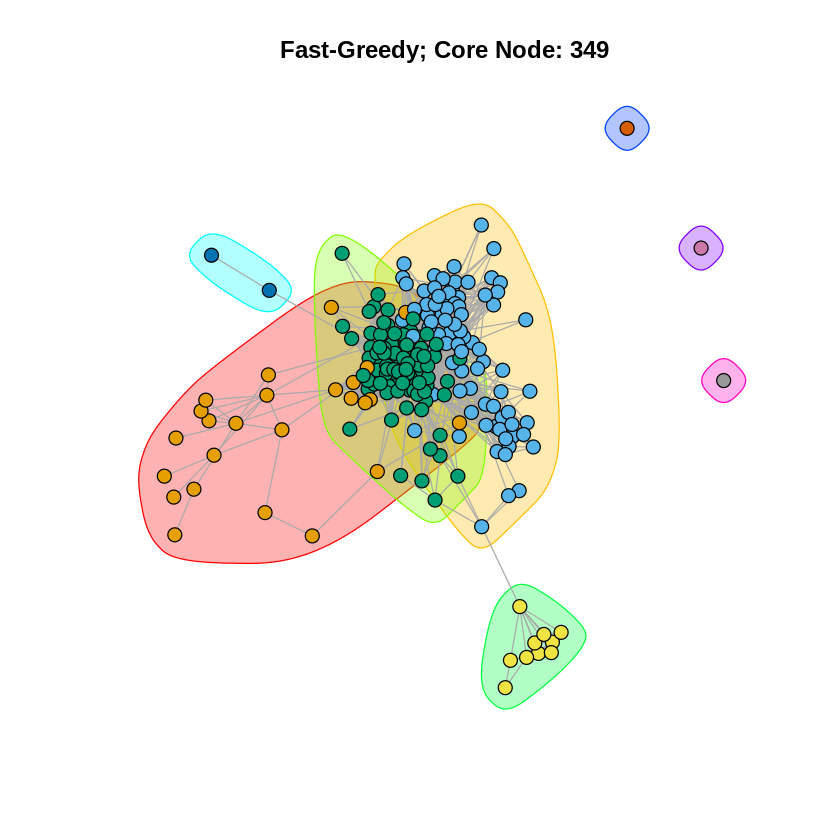

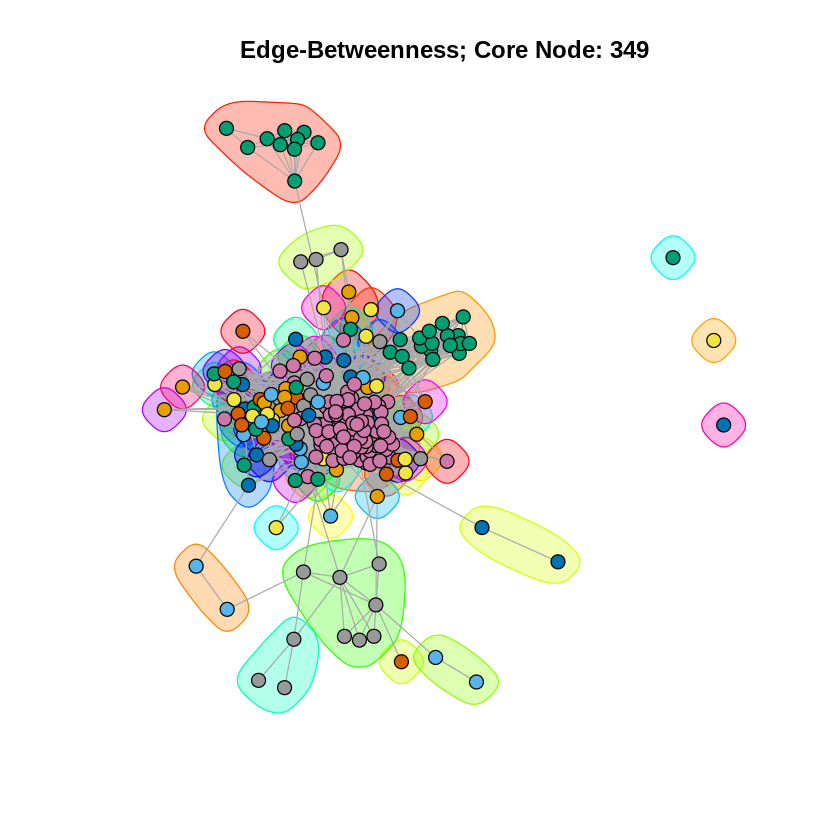

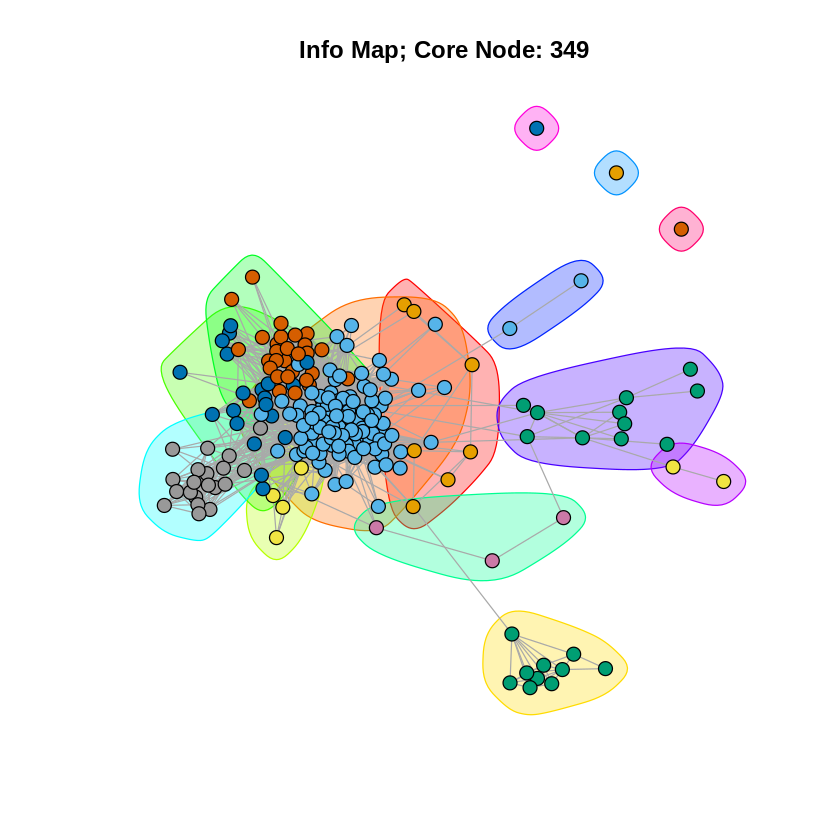

In [ ]:
#q10 node 349
community_detect(induced.subgraph(g, neighbors(g,349)), 349)

Node: 484 
[1] "Fast-Greedy Modularity Node 484 is 0.534214154606172"
[1] "Edge-Betweenness Modularity Node 484 is 0.515441277123504"
[1] "Info Map Modularity Node 484 is 0.543443679279522"


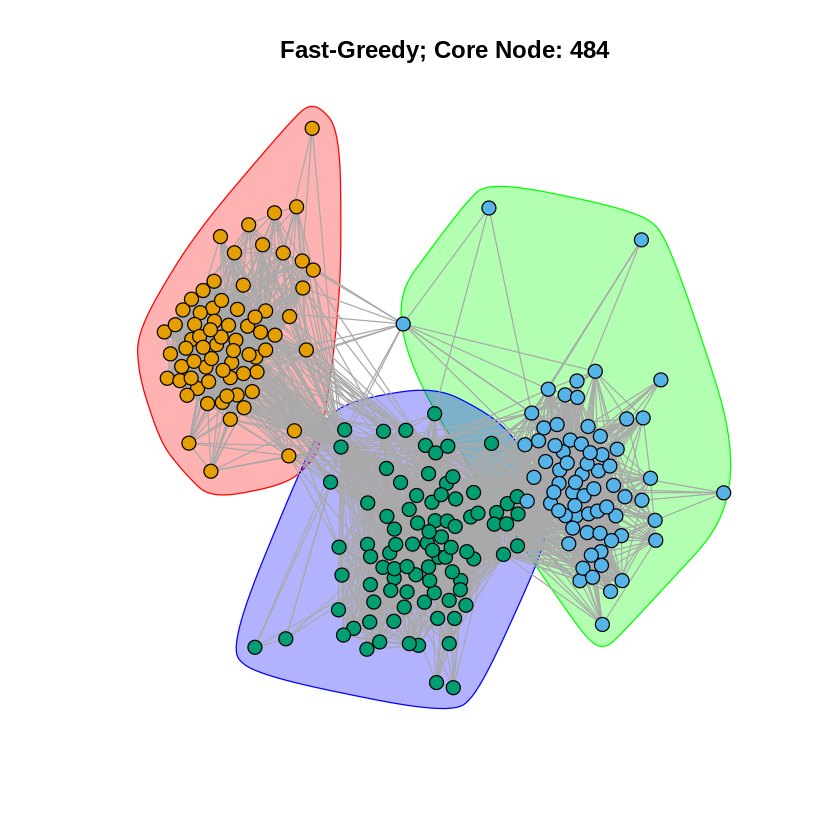

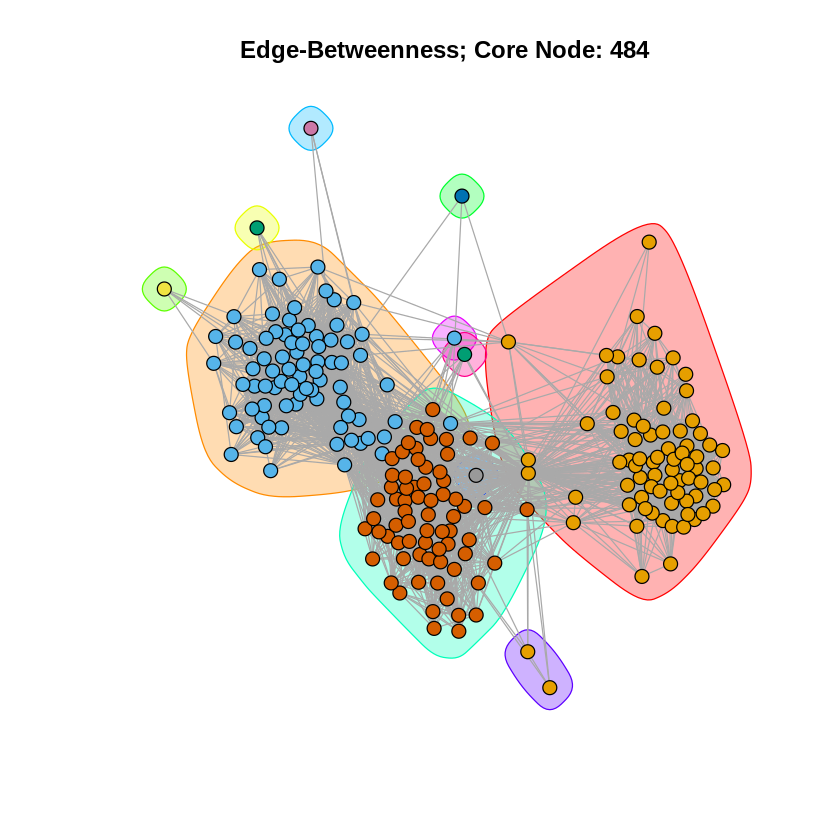

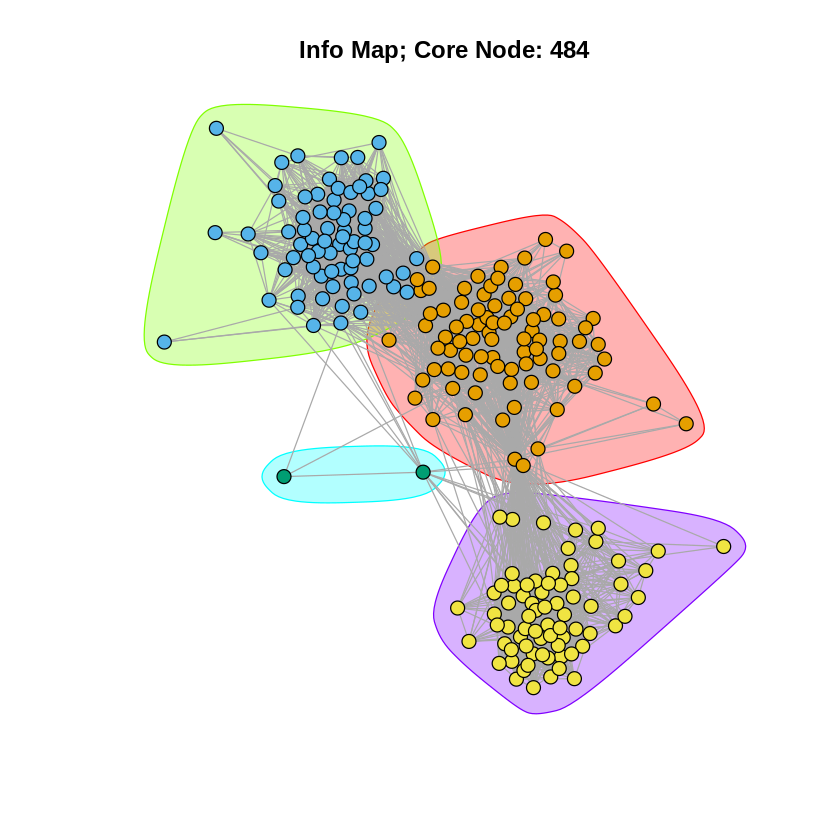

In [ ]:
#q10 node 484
community_detect(induced.subgraph(g, neighbors(g,484)), 484)

Node: 1087 
[1] "Fast-Greedy Modularity Node 1087 is 0.148195631953499"
[1] "Edge-Betweenness Modularity Node 1087 is 0.0324952980499141"
[1] "Info Map Modularity Node 1087 is 0.0273715944871147"


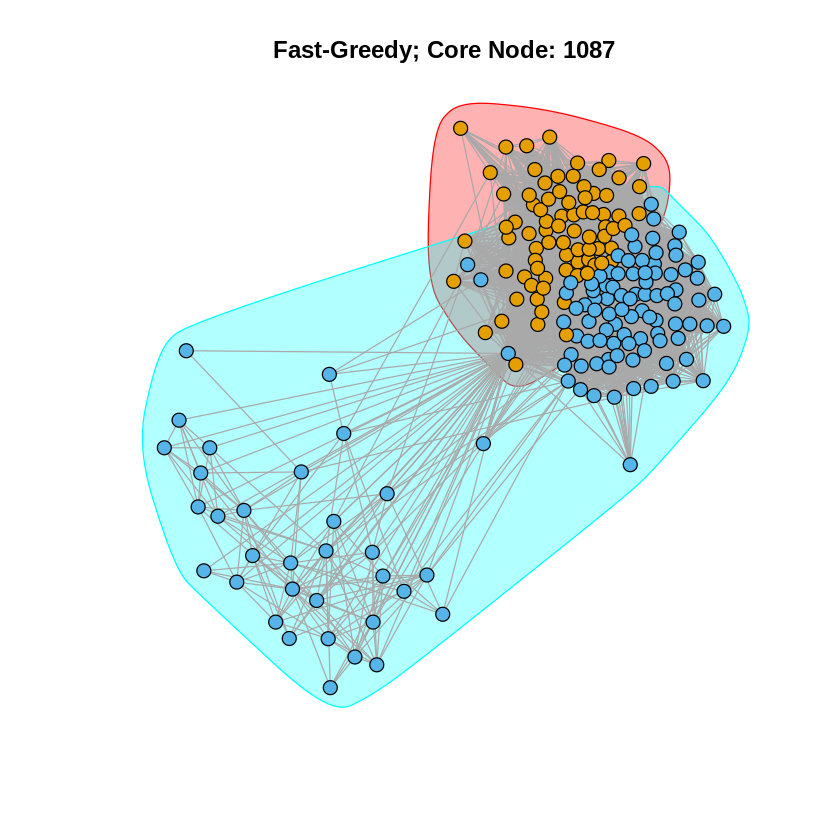

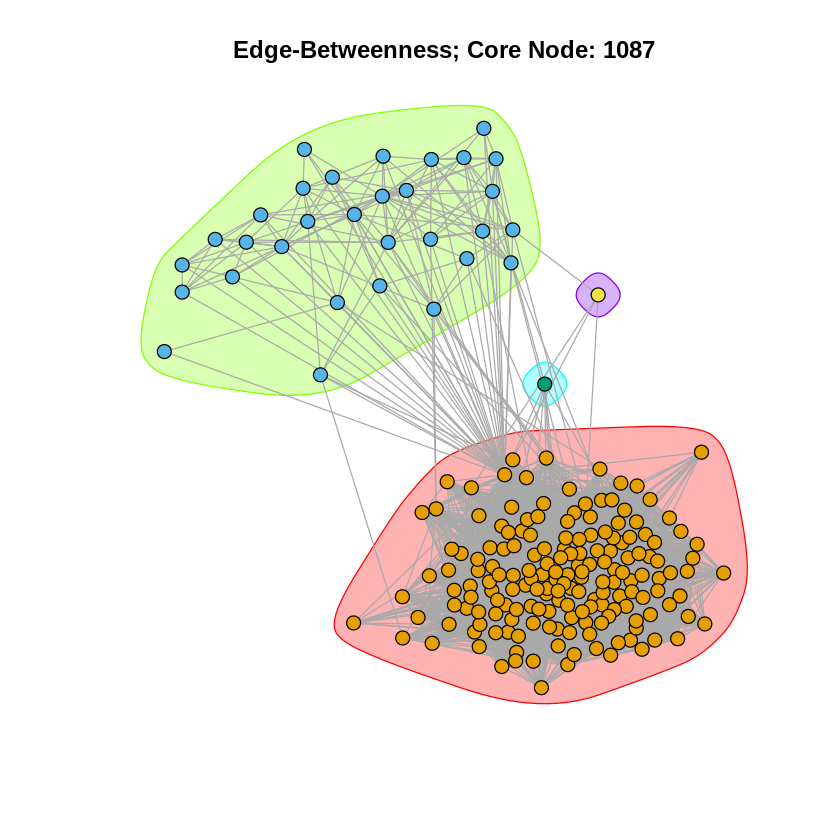

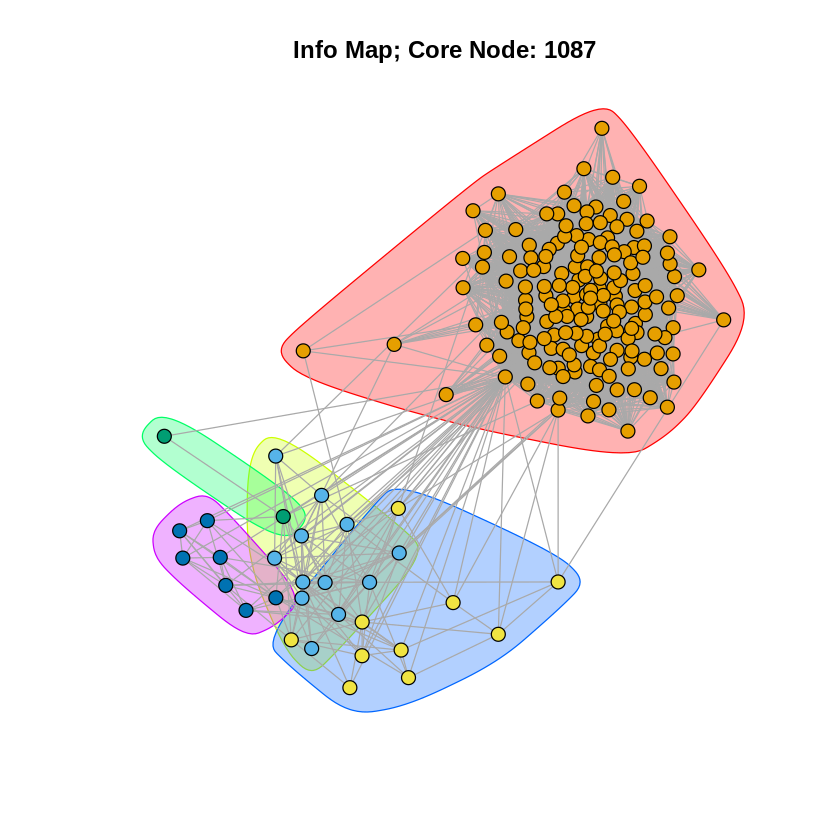

In [ ]:
#q10 node 1087
community_detect(induced.subgraph(g, neighbors(g,1087)), 1087)

## Q11

QUESTION 11: Write an expression relating the Embeddedness between the core node and
a non-core node to the degree of the non-core node in the personalized network of the core node.

In [ ]:
#Embeddedness functions
mutual_friends <- function(g, x, y) {
  y_neighbor <- neighbors(g, y)
  x_neighbor <- neighbors(g, x)
  return (intersection(y_neighbor, x_neighbor))
}

embeddedness <- function(g, x, y) {
  return (length(mutual_friends(g, x, y)))
}

## Q12

##### Question 12:  For each of the core node’s personalized network (use the same core nodes as Question 9), plot the distribution histogram of embeddedness and dispersion. In this question, you will have 10 plots.

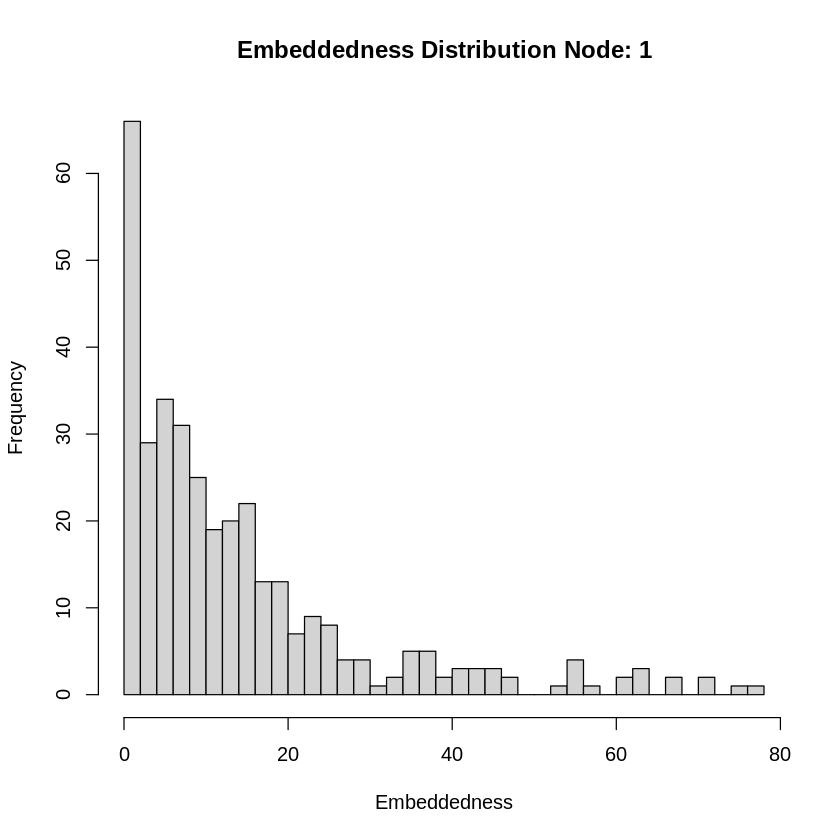

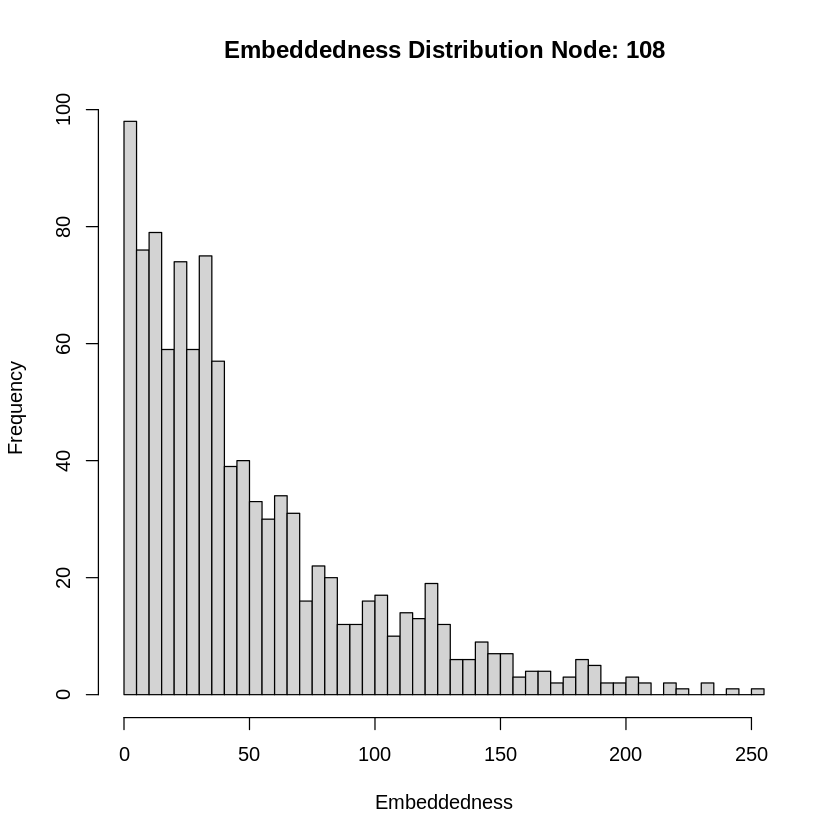

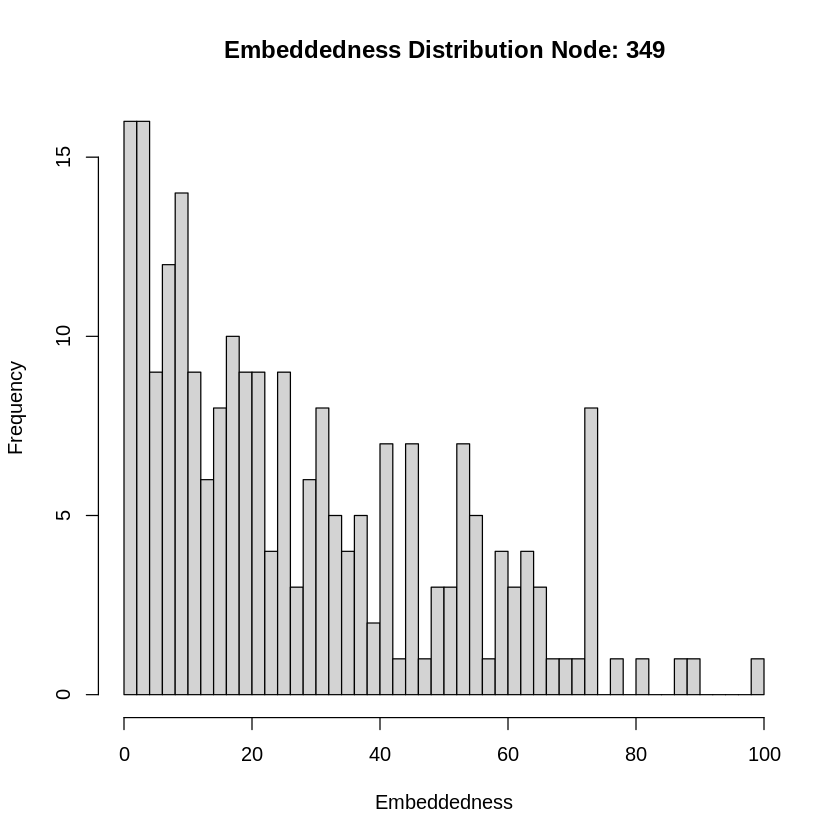

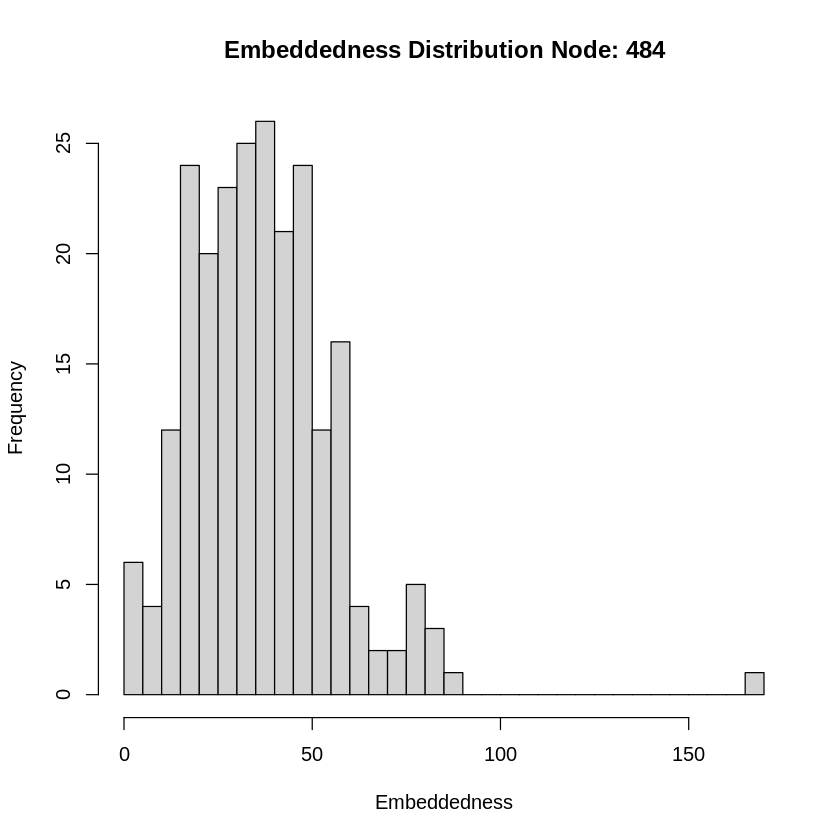

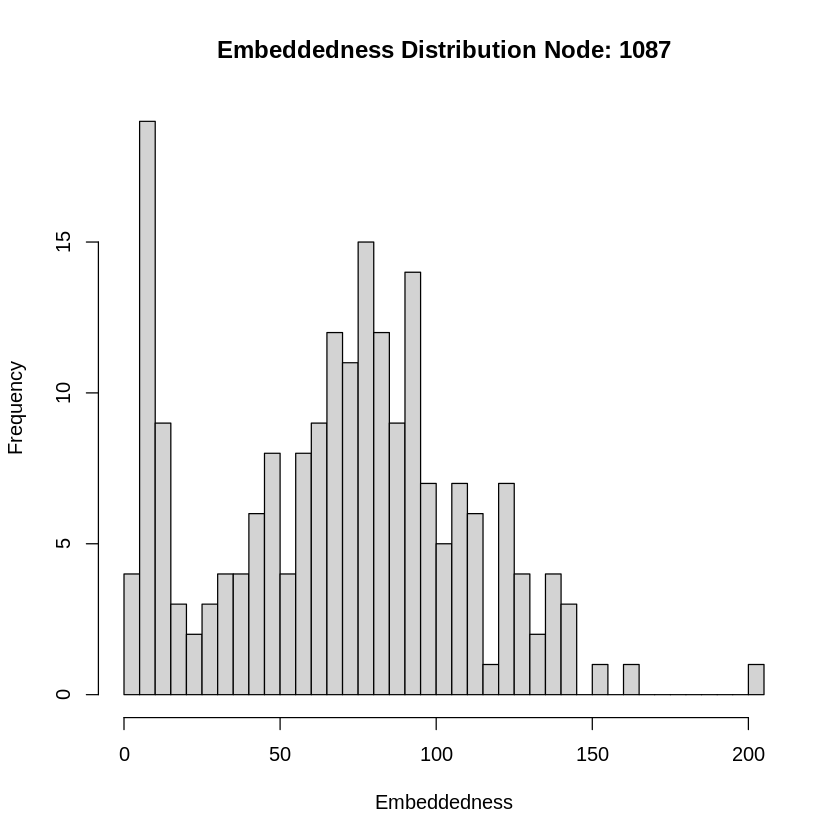

In [ ]:
#plot embeddedness
node_id <- c(1, 108, 349, 484, 1087)
ego_graph <- make_ego_graph(g, 1, nodes = c('1', '108', '349', '484','1087'))

for (i in 1:length(node_id))
{
  embeddedness = sort(degree(ego_graph[[i]])) - 1
  embeddedness = embeddedness[1:length(embeddedness)-1]
  hist(embeddedness, breaks=50, main=paste("Embeddedness Distribution Node:", node_id[i]), xlab="Embeddedness")
}

In [ ]:
#Dispersion function 
dispersion_func <- function(g, node_id) {
  g1 = induced.subgraph(g, c(node_id, neighbors(g, node_id)))
  nei = neighbors(g, node_id)
  d = diameter(g1)
  dispersion = numeric(0)
  embeddedness = numeric(0)

  for(i in 1:length(nei)) {
    embeddedness = c(embeddedness, length(intersect(nei, neighbors(g, nei[i]))))
  }
  for(i in 1:length(nei)) {
    mutual_friends = intersect(nei, neighbors(g, nei[i]))
    delete_vert = delete.vertices(g1, c(which(V(g1)$name == node_id), which(V(g1)$name==nei[i])))
    dist = numeric(0)
    for(x in 1:length(mutual_friends)) {
      for(y in (x + 1):length(mutual_friends)) {
        temp = distances(delete_vert, which(V(delete_vert)$name == mutual_friends[x]), which(V(delete_vert)$name == mutual_friends[y])) 
        if(length(temp) == 0 || is.infinite(temp)) {
          temp = d + 2
        }
        dist = c(dist, temp)  
      }
    }
    dispersion = c(dispersion, sum(dist))
  }
  hist(dispersion[which(dispersion!=Inf)], breaks = 50, main="Dispersion Distribution", xlab="Dispersion")
}

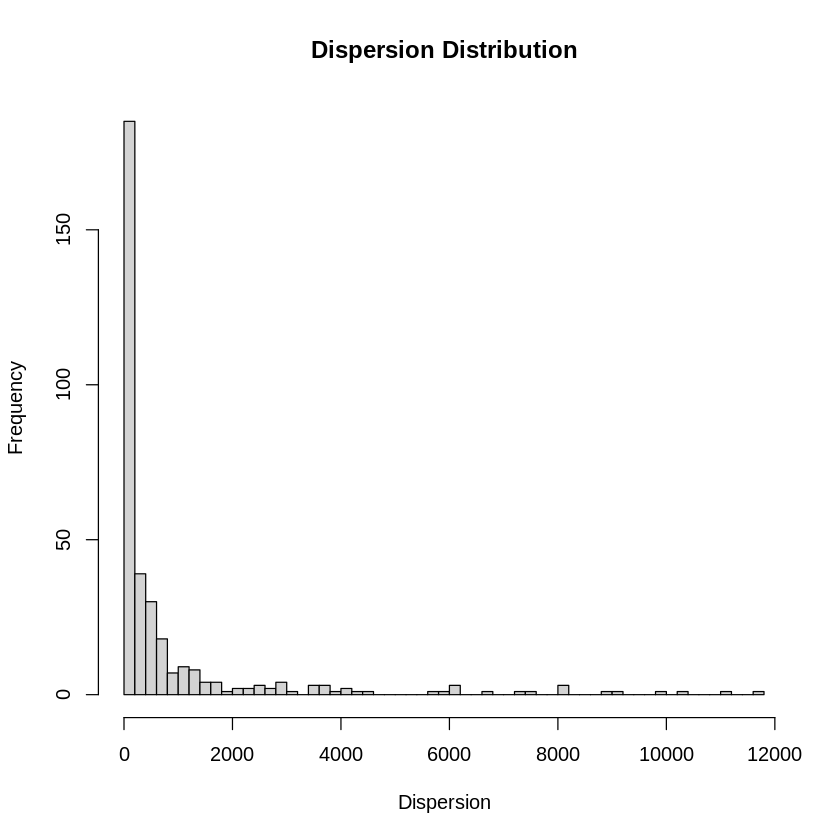

In [ ]:
#q12 Node 1
dispersion_func(g, 1)

In [ ]:
#q12 Node 108
dispersion_func(g, 108)

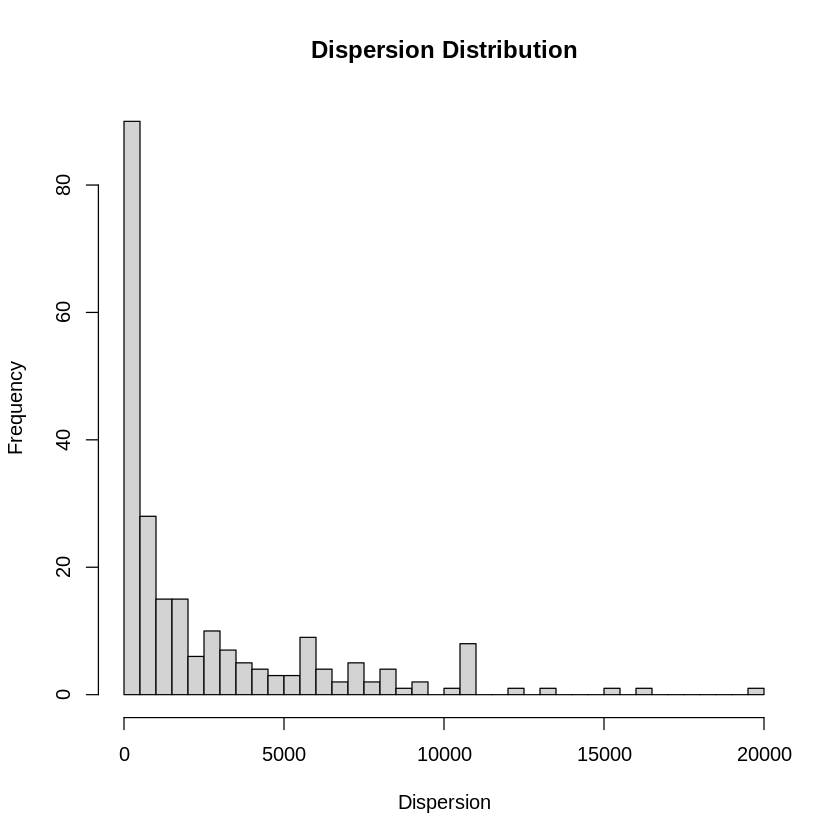

In [ ]:
#q12 Node 349
dispersion_func(g, 349)

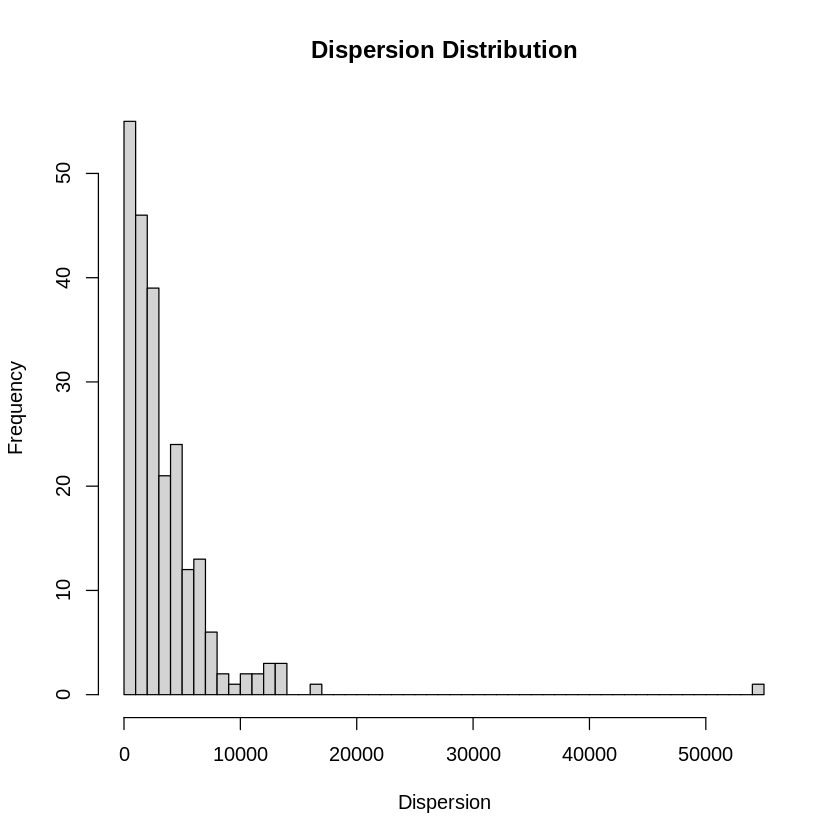

In [ ]:
#q12 Node 484
dispersion_func(g, 484)

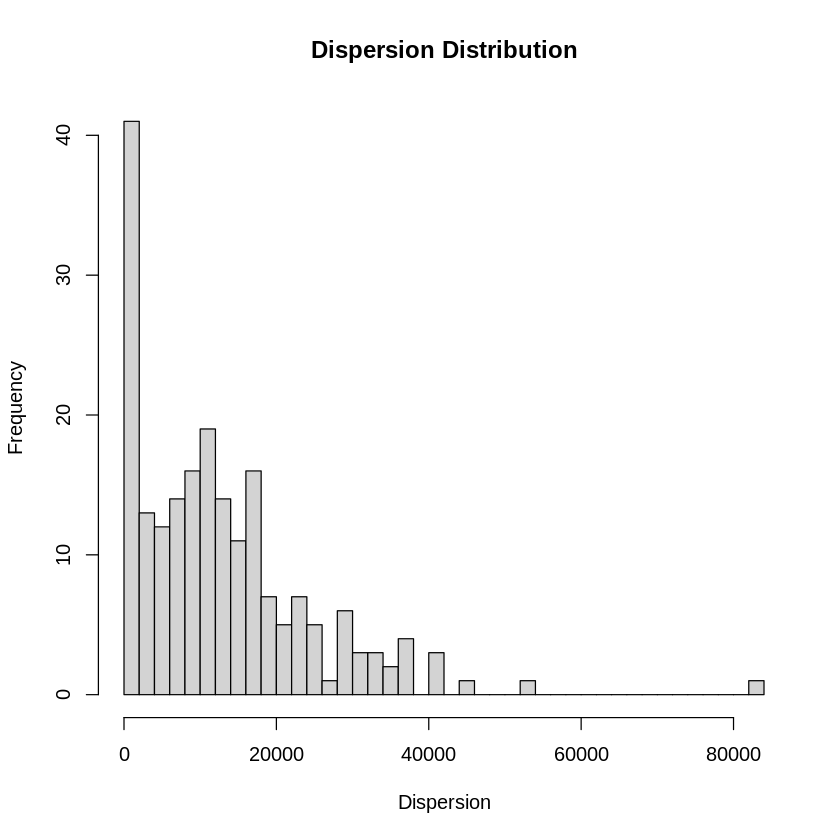

In [ ]:
#q12 Node 1087
dispersion_func(g, 1087)

## Q13&14

QUESTION 13: For each of the core node’s personalized network, plot the community structure
of the personalized network using colors and highlight the node with maximum dispersion. Also,
highlight the edges incident to this node. To detect the community structure, use Fast-Greedy
algorithm. In this question, you will have 5 plots.

QUESTION 14: Repeat Question 13, but now highlight the node with maximum embeddedness
and the node with maximum dispersion
embeddedness (excluding the nodes having zero embeddedness if there
are any). Also, highlight the edges incident to these nodes. Report the id of those nodes.

In [ ]:
#MAX embedded and dispersion functions (question 13 and 14)
max_dispersion_embedd <- function(g, node_id) {
  g1 = induced.subgraph(g, c(node_id, neighbors(g, node_id)))
  nei = neighbors(g, node_id)
  d = diameter(g1)
  dispersion = numeric(0)
  embeddedness = numeric(0)
  ratio = numeric(0)

  for(i in 1:length(nei)) {
    embeddedness = c(embeddedness, length(intersect(nei, neighbors(g, nei[i]))))
  }
  for(i in 1:length(nei)) {
    mutual_friends = intersect(nei, neighbors(g, nei[i]))
    delete_vert = delete.vertices(g1, c(which(V(g1)$name == node_id), which(V(g1)$name==nei[i])))
    dist = numeric(0)
    for(x in 1:length(mutual_friends)) {
      for(y in (x + 1):length(mutual_friends)) {
        temp = distances(delete_vert, which(V(delete_vert)$name == mutual_friends[x]), which(V(delete_vert)$name == mutual_friends[y])) 
        if(length(temp) == 0 || is.infinite(temp)) {
          temp = d + 2
        }
        dist = c(dist, temp)  
      }
    }
    dispersion = c(dispersion, sum(dist))
  }

  network = fastgreedy.community(g1)

  #Q13
  max_disp = which.max(dispersion)
  node_disp = nei[max_disp]
  print(paste('Max Dispersion:', node_disp-1, dispersion[max_disp]))

  #Plot Community Structure Max disp
  color = network$membership + 1
  size = rep(3, length(color))

  edge_color = rep("grey", length(E(g1)))
  edge_weight = rep(0.2, length(E(g1)))
  edge_color[which(get.edgelist(g1, name=FALSE)[,1]==max_disp|get.edgelist(g1, name=FALSE)[,2]==max_disp)] = "red"
  edge_weight[which(get.edgelist(g1, name=FALSE)[,1]==max_disp|get.edgelist(g1, name=FALSE)[,2]==max_disp)] = 2;
  size[max_disp] = 5
  color[max_disp] = 7
  plot.igraph(g1, vertex.size = size, vertex.label=NA, edge.width=edge_weight, edge.color=edge_color, vertex.color=color,
   main = sprintf("Community Structure Max Dispersion Node %s", node_id))

  #Q14
  max_embed = which.max(embeddedness)
  node_embed = nei[max_embed]

  for (k in 1:length(dispersion)) {
    temp = dispersion[k] * (1/embeddedness[k])
    if (is.infinite(temp)) {temp = d + 2}
      ratio = c(ratio, temp)
  }

  max_em_disp = which.max(ratio)
  node_em_disp = nei[max_em_disp]
  print(paste('Max Embededdness:', node_embed-1, embeddedness[max_embed]))
  print(paste('Max Dispersion/Embeddeness Ratio:', node_em_disp-1, dispersion[max_em_disp]/embeddedness[max_em_disp]))

  #Plot disp/embed ratio communities
  color = network$membership + 1
  size = rep(3, length(color))

  edge_color = rep("grey", length(E(g1)))
  edge_weight = rep(0.2, length(E(g1)))
  edge_color[which(get.edgelist(g1, name=FALSE)[,1]==max_em_disp|get.edgelist(g1, name=FALSE)[,2]==max_em_disp)] = "green"
  edge_weight[which(get.edgelist(g1, name=FALSE)[,1]==max_em_disp|get.edgelist(g1, name=FALSE)[,2]==max_em_disp)] = 2;
  size[max_em_disp] = 5
  color[max_em_disp] = 7
  plot.igraph(g1, vertex.size = size, vertex.label=NA, edge.width=edge_weight, edge.color=edge_color, vertex.color=color, 
  main = sprintf("Community Structure Ratio Dispersion/Embeddedness Node %s", node_id))


  #Plot Community Structure Max embed
  color = network$membership + 1
  size = rep(3, length(color))
  edge_color = rep("grey", length(E(g1)))
  edge_weight = rep(0.2, length(E(g1)))

  edge_color[which(get.edgelist(g1, name=FALSE)[,1]==max_embed|get.edgelist(g1, name=FALSE)[,2]==max_embed)] = "blue"
  edge_weight[which(get.edgelist(g1, name=FALSE)[,1]==max_embed|get.edgelist(g1, name=FALSE)[,2]==max_embed)] = 2;
  size[max_embed] = 5
  color[max_embed] = 7
  plot.igraph(g1, vertex.size = size, vertex.label=NA, edge.width=edge_weight, edge.color=edge_color, vertex.color=color, 
  main = sprintf("Community Structure Max Embeddedness Node %s", node_id))    
}

[1] "Max Dispersion: 56 11712"
[1] "Max Embededdness: 56 77"
[1] "Max Dispersion/Embeddeness Ratio: 56 152.103896103896"


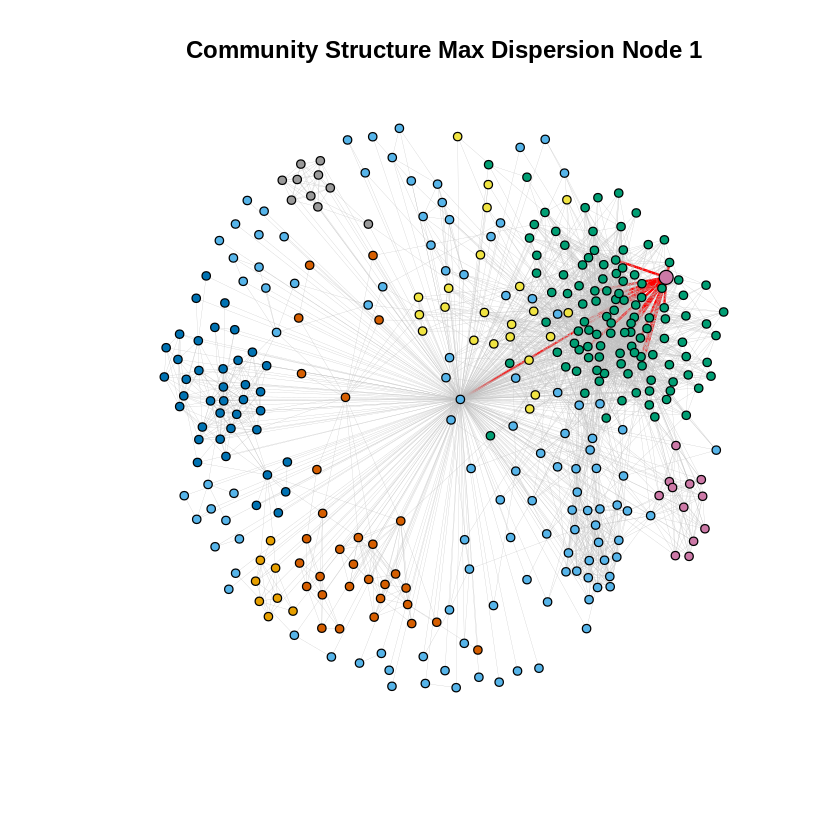

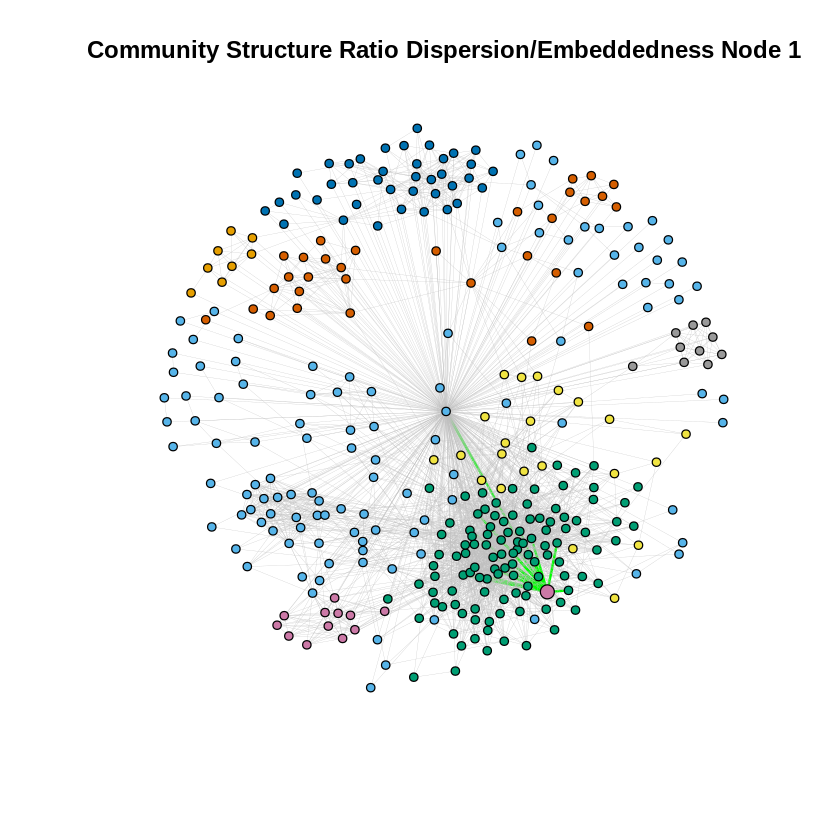

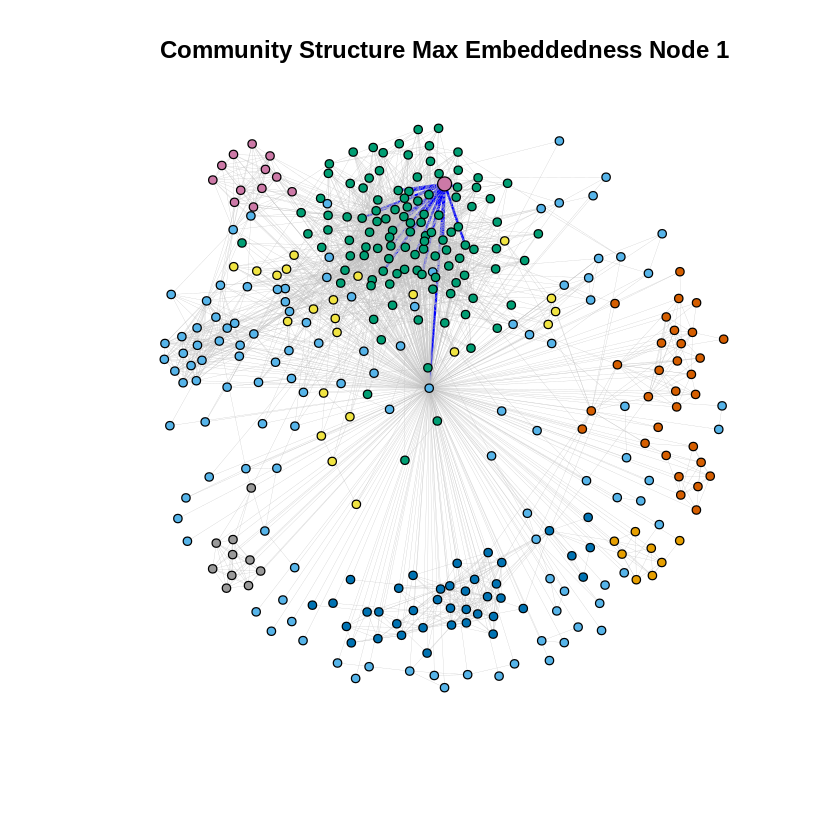

In [ ]:
#q13/14 node 1
max_dispersion_embedd(g, 1)

[1] "Max Dispersion: 1888 127520"
[1] "Max Embededdness: 1888 253"
[1] "Max Dispersion/Embeddeness Ratio: 1888 504.03162055336"


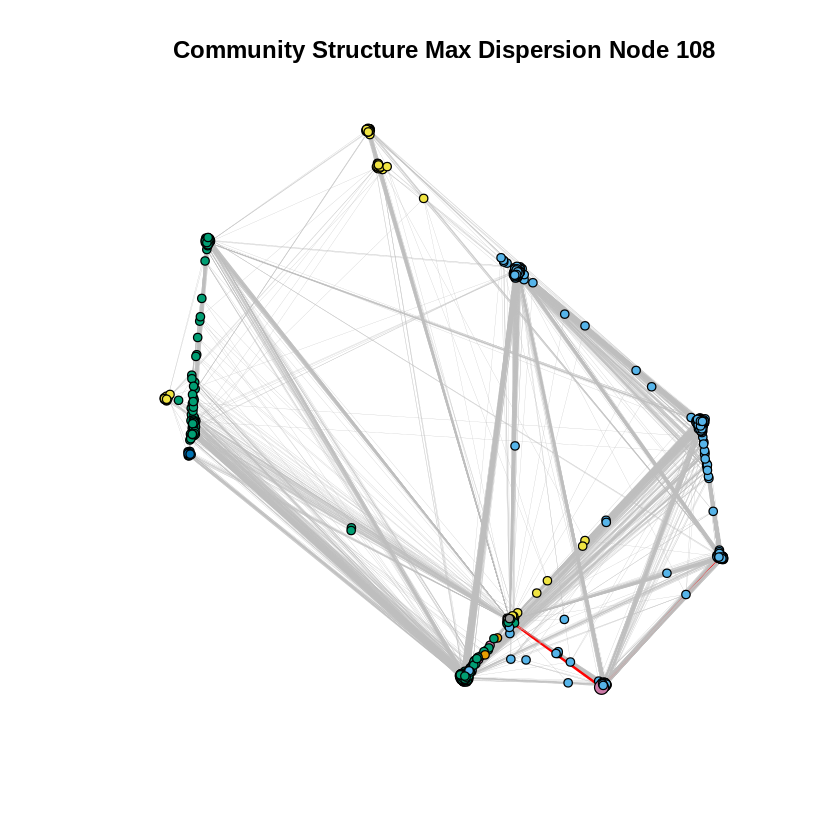

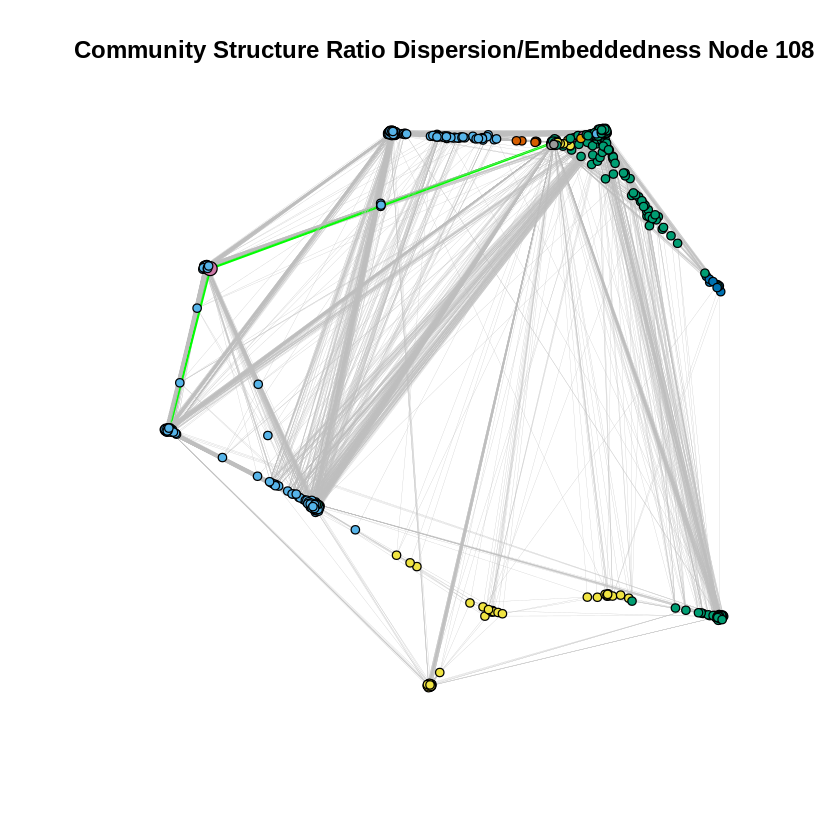

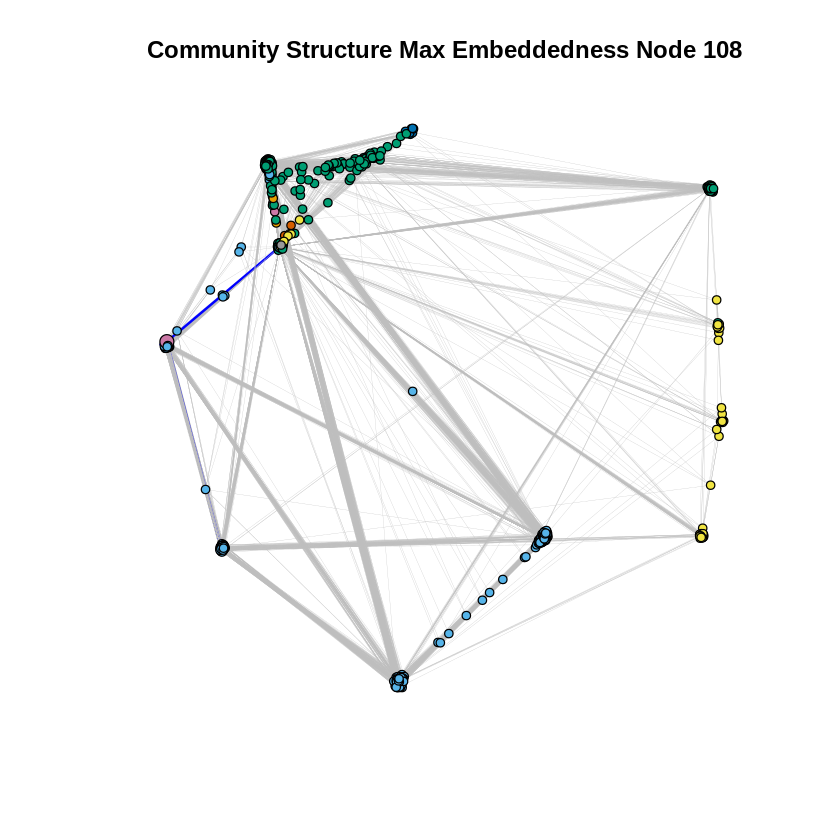

In [ ]:
#q13/14 node 108
max_dispersion_embedd(g, 108)

[1] "Max Dispersion: 376 19808"
[1] "Max Embededdness: 376 100"
[1] "Max Dispersion/Embeddeness Ratio: 376 198.08"


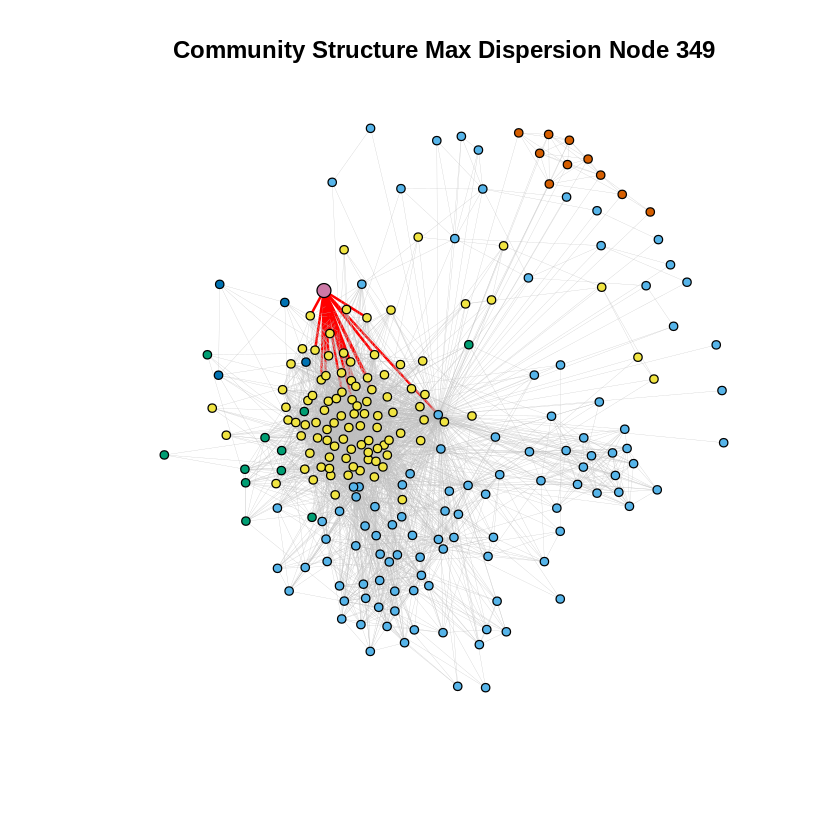

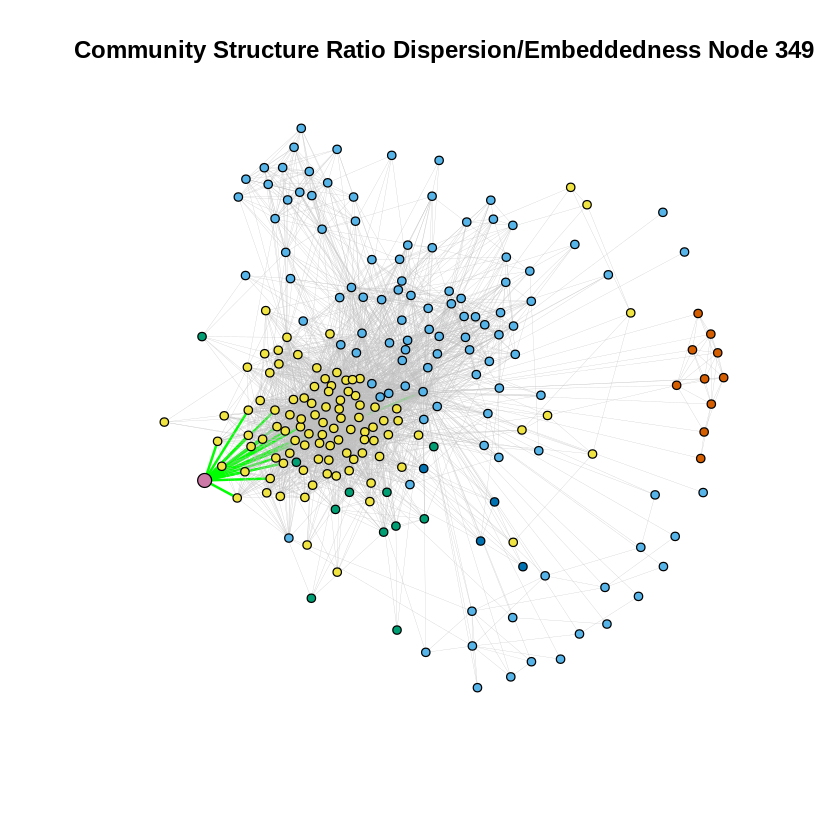

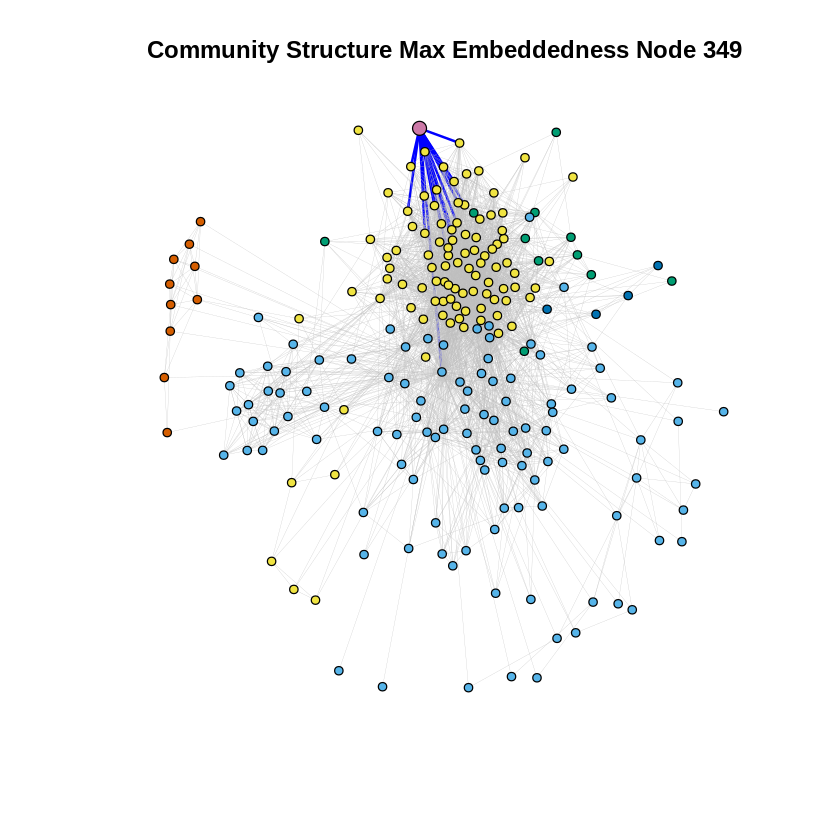

In [ ]:
#q13/14 node 349
max_dispersion_embedd(g, 349)

[1] "Max Dispersion: 107 54788"
[1] "Max Embededdness: 107 166"
[1] "Max Dispersion/Embeddeness Ratio: 107 330.048192771084"


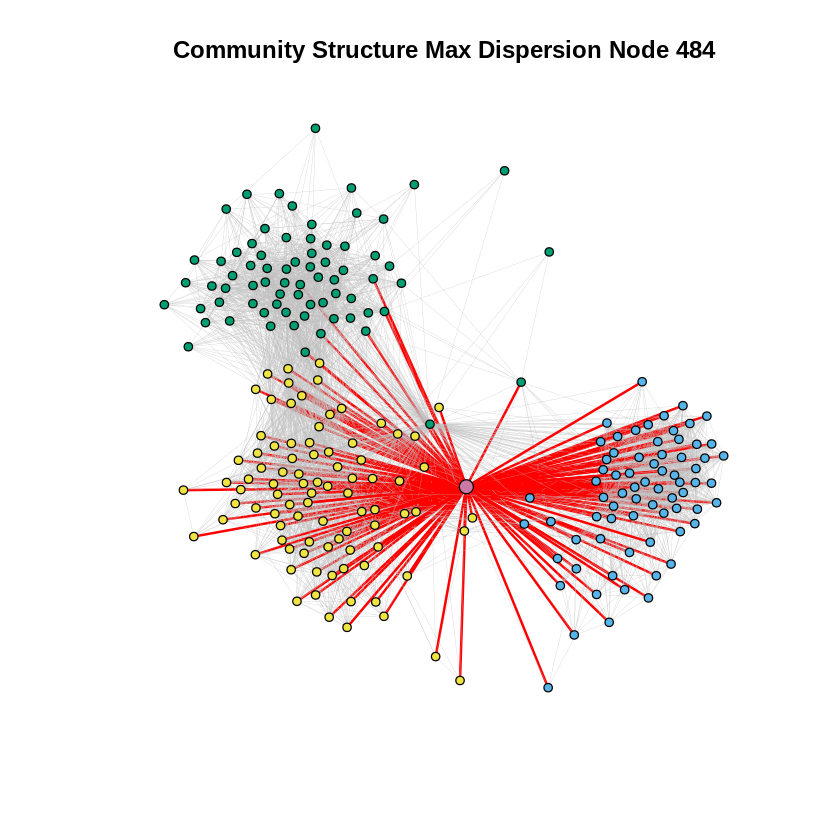

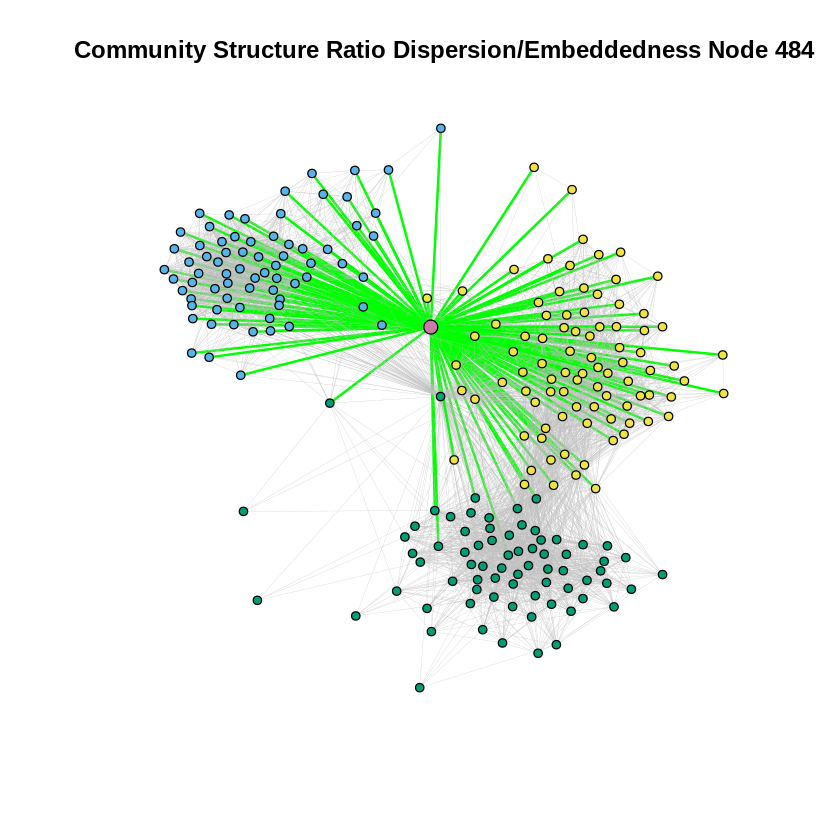

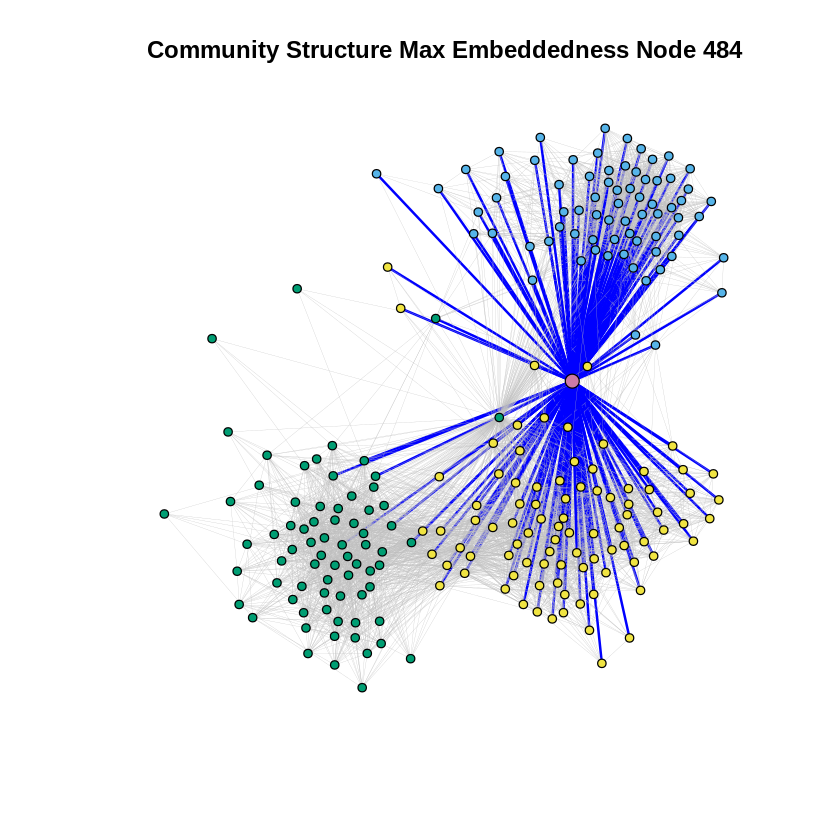

In [ ]:
#q13/14 node 484
max_dispersion_embedd(g, 484)

[1] "Max Dispersion: 107 82832"
[1] "Max Embededdness: 107 204"
[1] "Max Dispersion/Embeddeness Ratio: 107 406.039215686275"


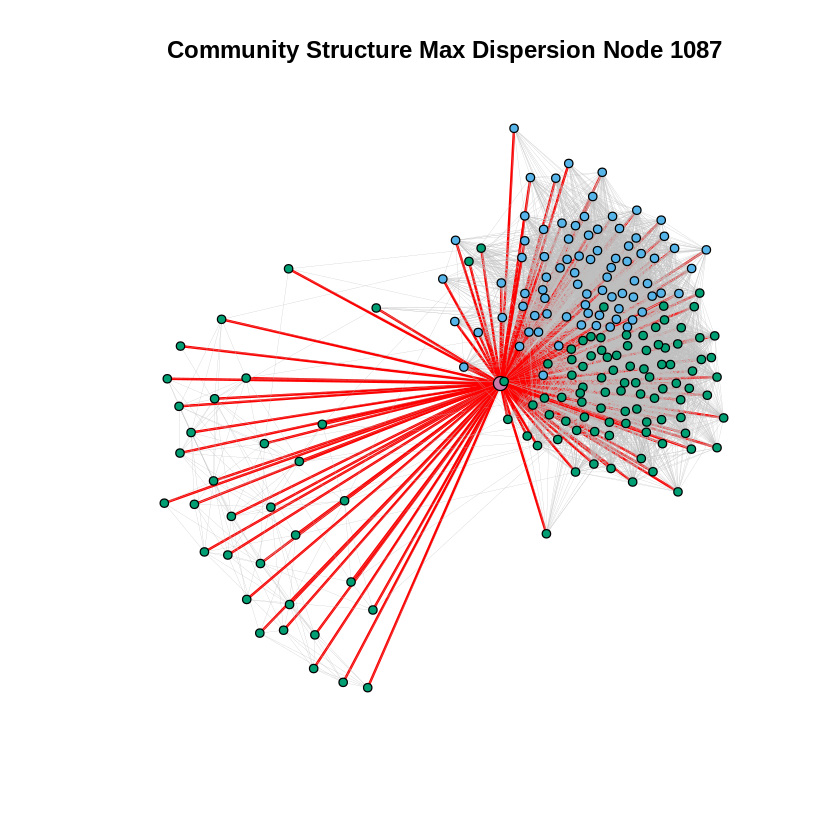

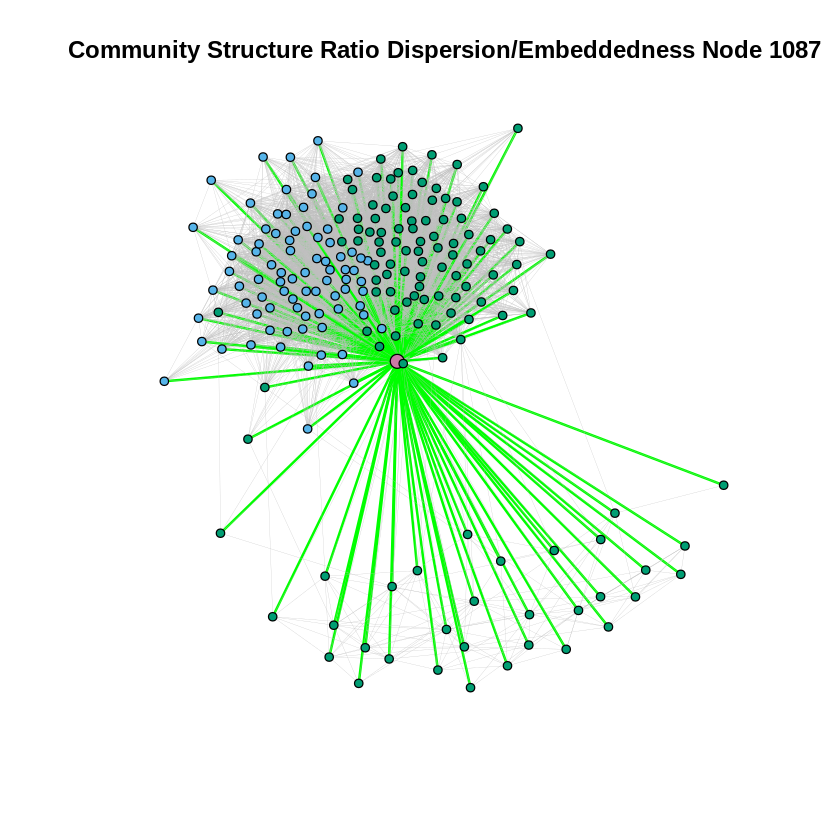

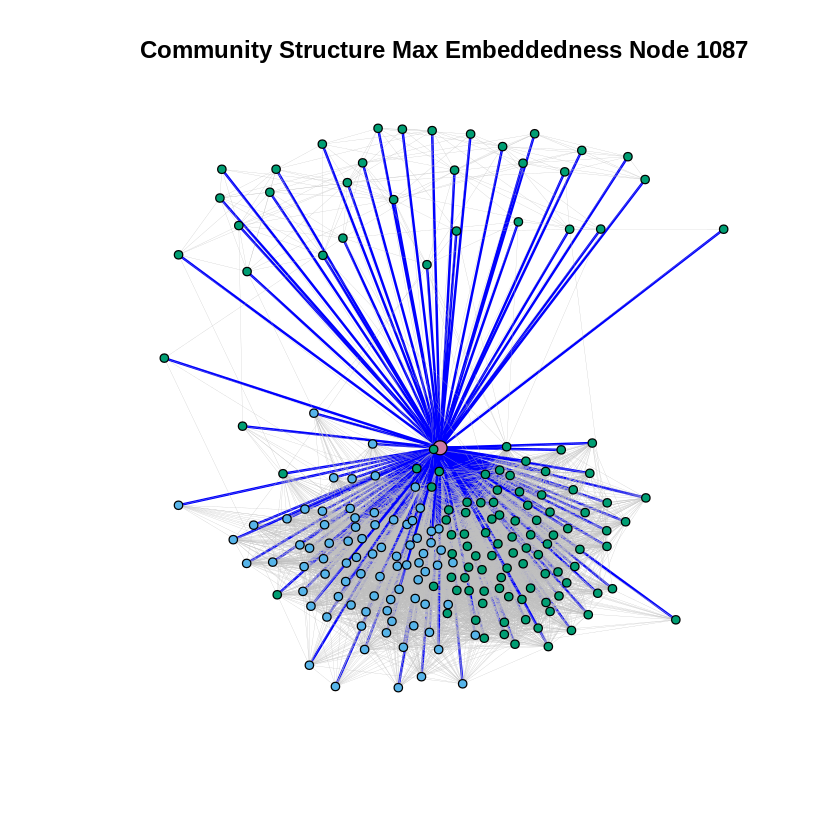

In [ ]:
#q13/14 node 1087
max_dispersion_embedd(g, 1087)

QUESTION 15: Use the plots from Question 13 and 14 to explain the characteristics of a node
revealed by each of this measure.

answered in overleaf


### Question 16
Friend recommendation in personalized networks¶

In [ ]:
fbGraph <- read_graph("facebook_combined.txt", format = 'edgelist', directed = FALSE)

N_edges <- gsize(fbGraph)
N_nodes <- vcount(fbGraph)

pn_415 <- make_ego_graph(fbGraph, nodes = c(415))
Nr <- which(degree(pn_415[[1]]) == 24)
print(paste("Length of Nr which need friend recommendations: ", length(Nr)))

[1] "Length of Nr which need friend recommendations:  11"

#### Question 17
Average accuracy of friend recommendation algorithm

In [ ]:
metric_comparison <- function(Nr, G, metric, n_steps) {
    avg_acc = c()
    for(user in Nr) {
        acc = c()
        for(step in c(1:n_steps)) {
            R = c()
            tempG = pn_415[[1]]
            nb_user = neighbors(tempG, user)
            for(n in nb_user) {
                if(runif(1, 0, 1) <= 0.25) {
                    tempG = delete_edges(tempG, edge(n, user))
                    R = c(R, n)
                }
            }
            
            left_neighbors = setdiff(nb_user, R)
            left_neighbors = c(left_neighbors, user)
            
            potential_neighbors = setdiff(V(tempG), left_neighbors)
            
            scores = c()
            for(node in potential_neighbors) {
                nb_node = neighbors(tempG, node)
                common = intersect(left_neighbors, nb_node)
                sc = 0
                if(metric == "common") {
                    sc = length(common)
                }
                if(metric == "jaccard") {
                    sc = length(common)/length(union(left_neighbors, nb_node))
                }
                if(metric == 'adamic_adar') {
                    sc = 0
                    
                    for(neigh in common) {
                        neighSet = length(neighbors(tempG, neigh))
                        sc = sc + 1/log(neighSet)
                    }
                }
                
                scores = c(scores, sc)
            }
            
            indices = sort(scores, decreasing = TRUE, index.return = TRUE)$ix
            recs = potential_neighbors[indices[1:length(R)]]
            inter_set <- intersect(recs, R)
            acc = c(acc, (length(inter_set) / length(R)))
        }
        avg_acc = c(avg_acc, mean(acc))
    }
    return(mean(avg_acc))
}

In [ ]:
common = metric_comparison(Nr, pn_415, "common", 10)
jaccard = metric_comparison(Nr, pn_415, "jaccard", 10)
adamic_adar = metric_comparison(Nr, pn_415, "adamic_adar", 10)

print(paste("Avg. accuracy for Common neighbours approach: ", common))
print(paste("Avg. accuracy for Jaccard approach: ", jaccard))
print(paste("Avg. accuracy for Adamic Adar approach: ", adamic_adar))

[1] "Avg. accuracy for Common neighbours approach:  0.854296208841663" </br>
[1] "Avg. accuracy for Jaccard approach:  0.829206576252031" </br>
[1] "Avg. accuracy for Adamic Adar approach:  0.850649350649351"

# PART 2

## Question 18

In [ ]:
path <- "gplus/"
# data <- read.delim("gplus/110701307803962595019.circles",sep="\n",header=FALSE)
list <- list.files(path)
circle_count <- 0
count <- 0

for (i in 1:length(list)) {
    filename <- paste(path, list[i], sep = "")
    file_type <- unlist(strsplit(filename, "\\."))[2]
    if (file_type == "edges") {
        count <-  count + 1
    }
    else if (file_type == "circles") {
        circle_data <- try(read.delim(filename, sep="\n", header=FALSE))
        if (!inherits(circle_data, "try-error")) circle_data
        if (length(unlist(circle_data)) > 2) {
            circle_count <- circle_count + 1
        }
    }
}
print(paste("Number of Personal Networks:",count))
print(paste("Number of Personal Networks for Users With More Than 2 Circles:",circle_count))

## Question 19 and 20

[1] "Modularity:  0.252780615146153"


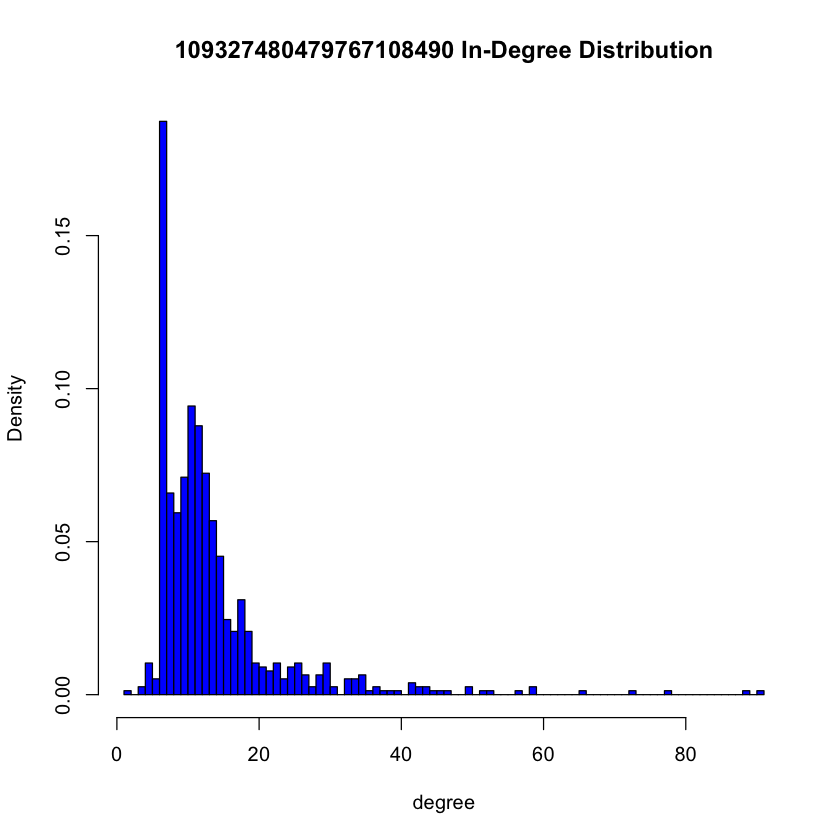

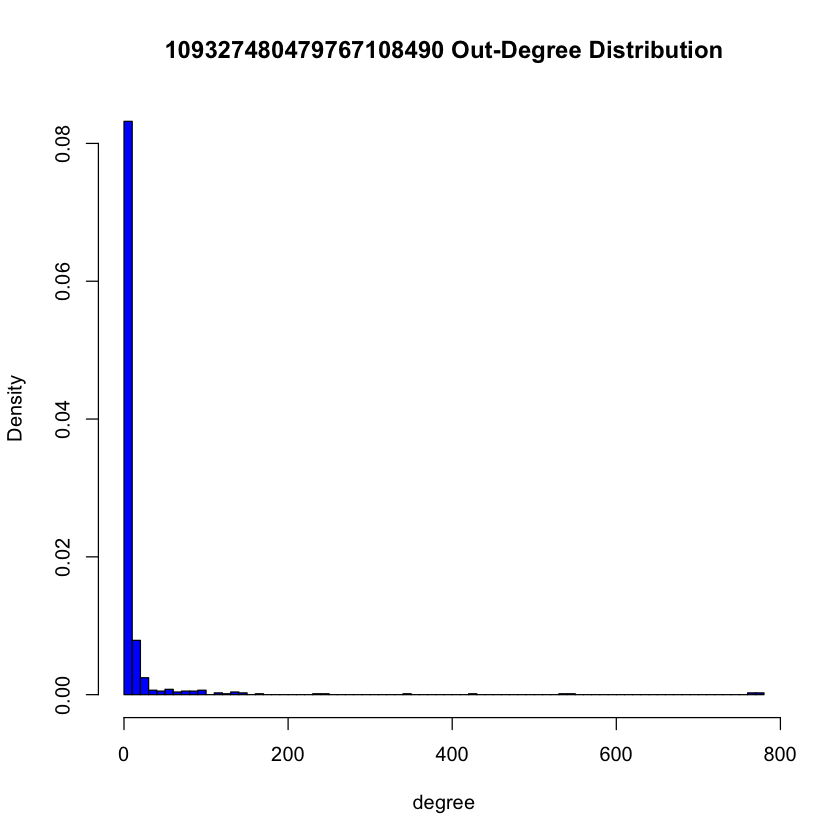

[1] "Modularity:  0.319473800936253"


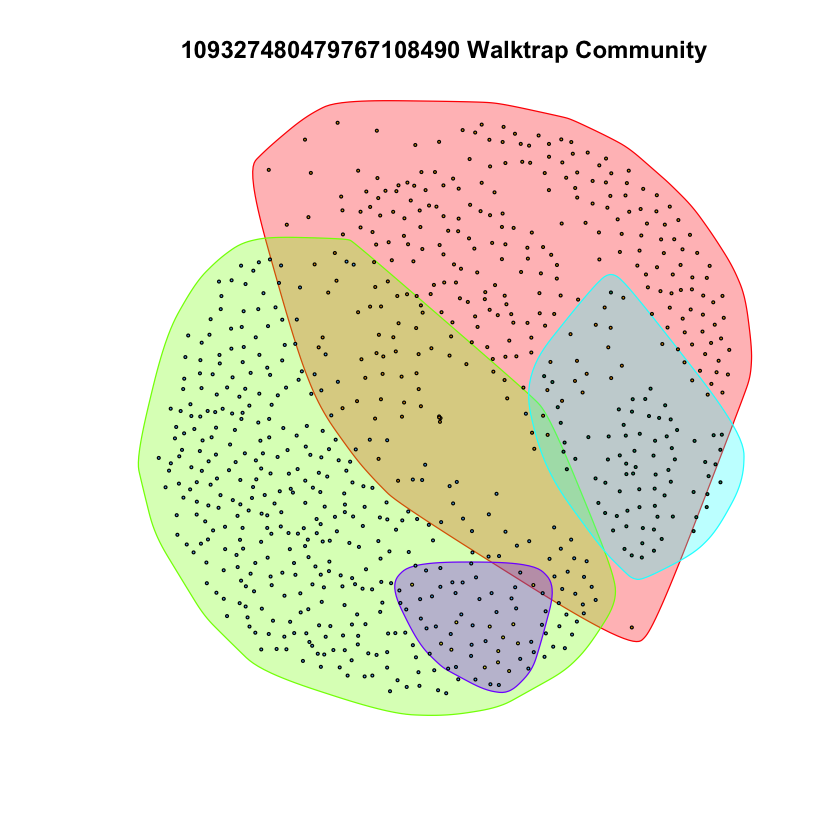

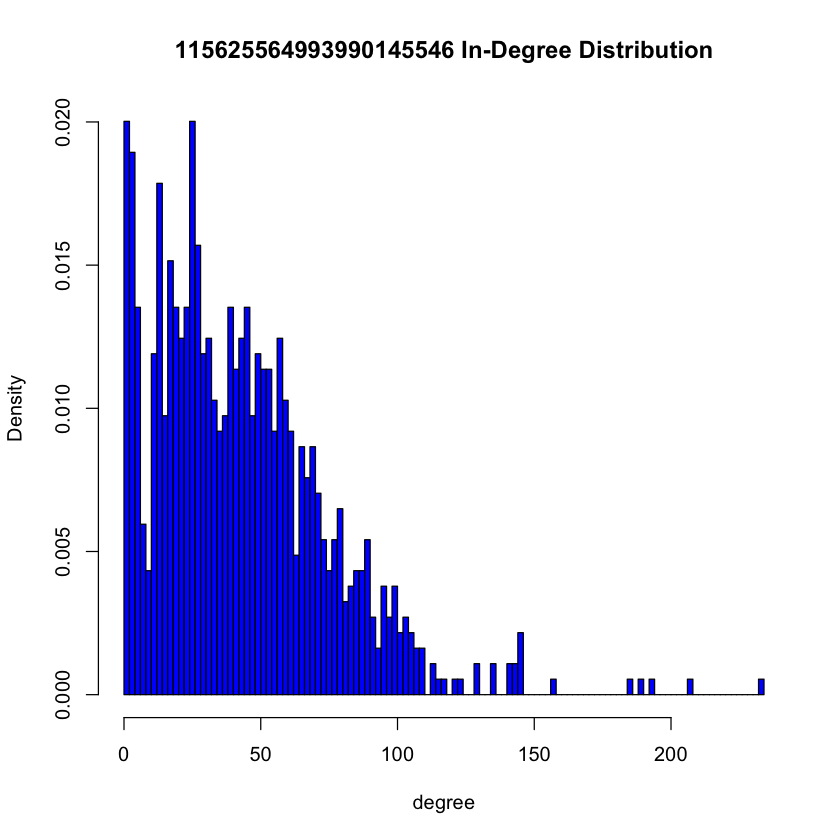

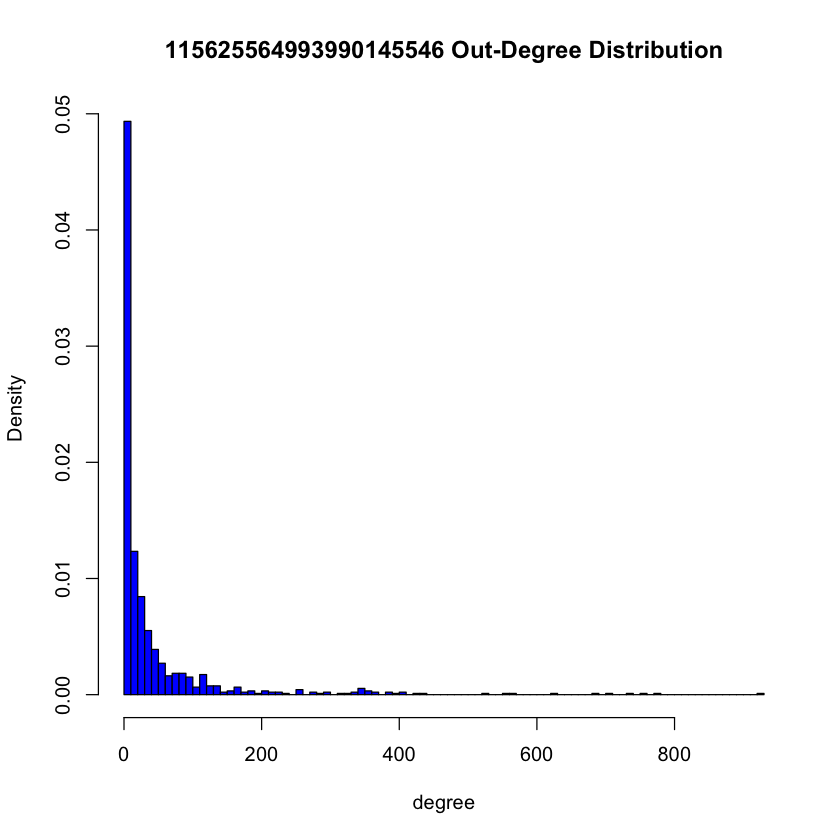

[1] "Modularity:  0.191093372723242"


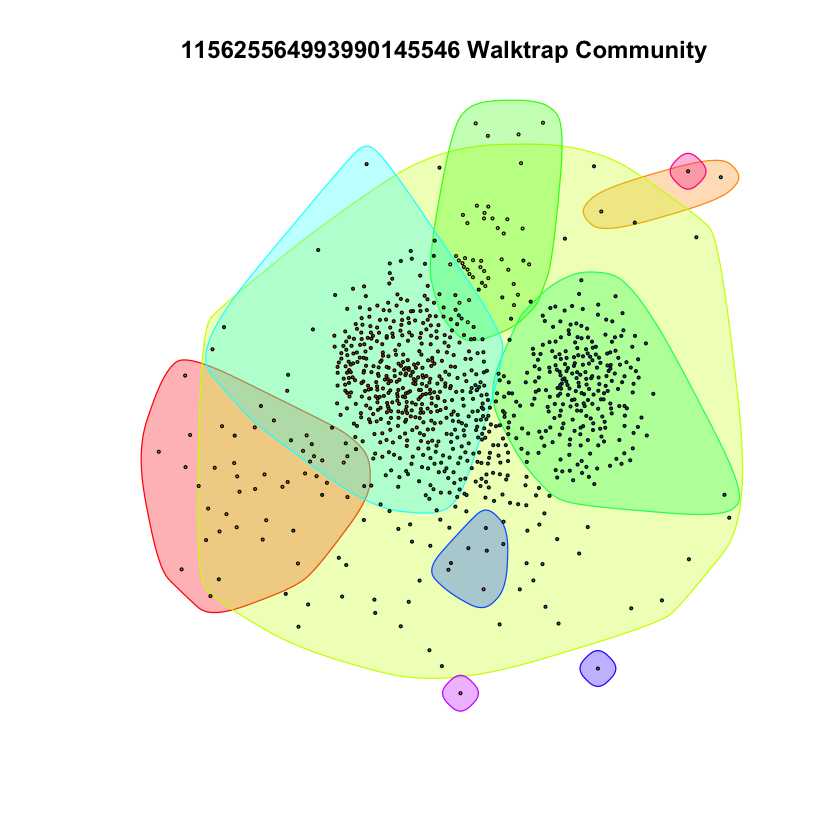

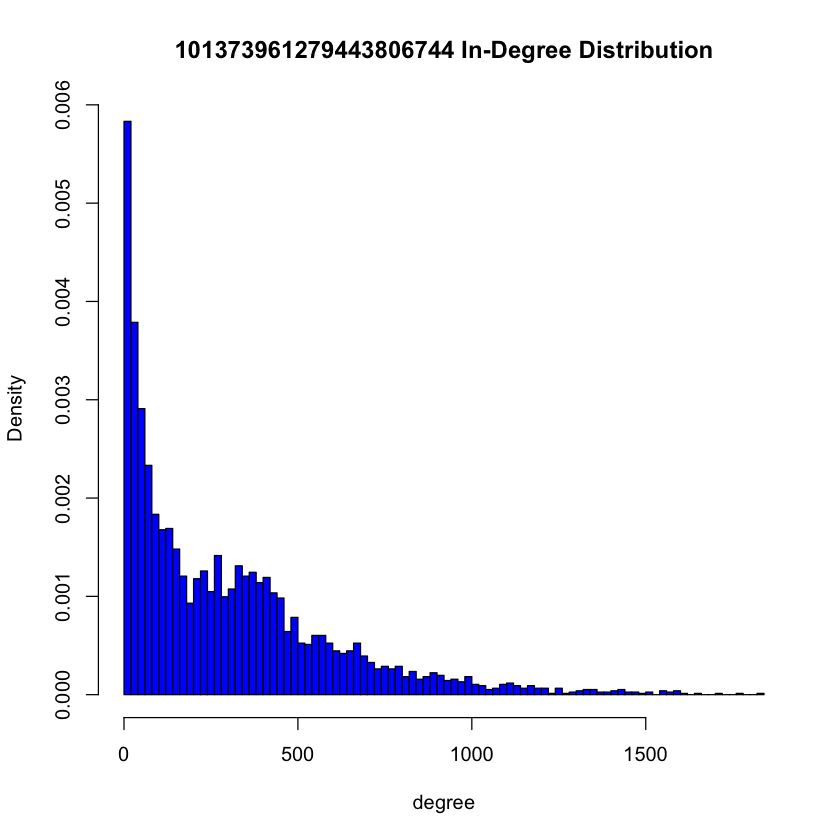

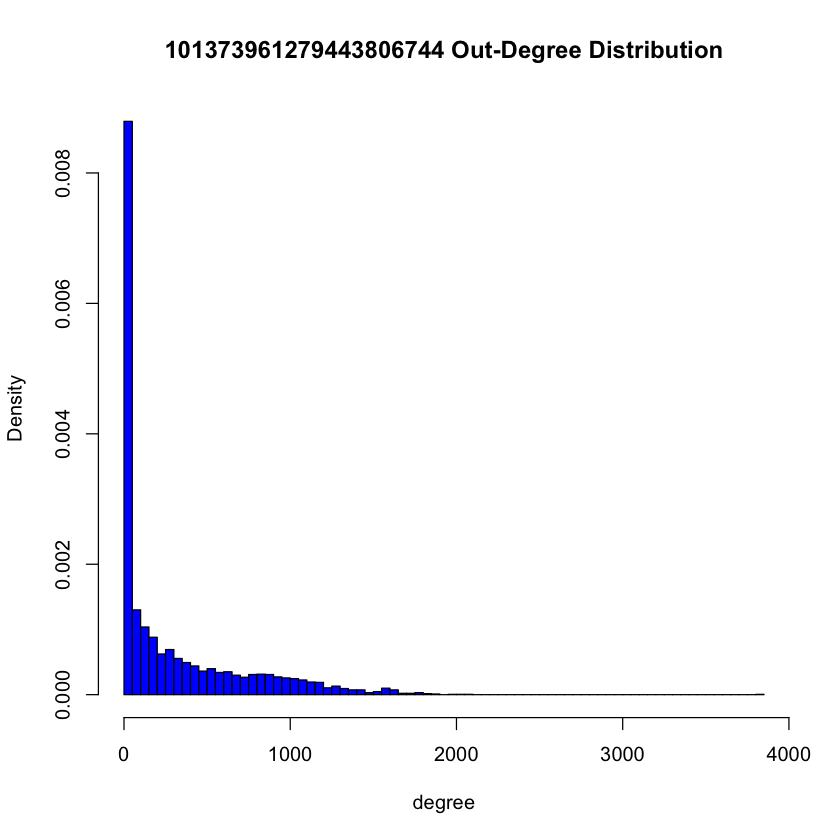

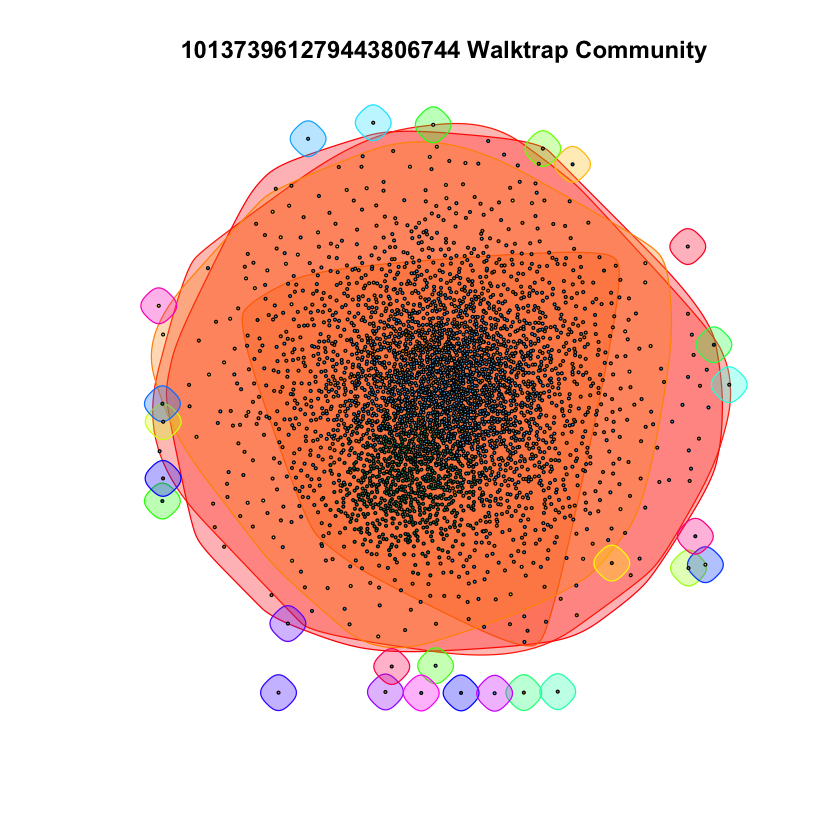

In [ ]:
node_ids <- c("109327480479767108490", 
"115625564993990145546", "101373961279443806744")

for (i in 1:length(node_ids)) {
    c <- node_ids[i]
    filename = paste(getwd(), "/",path,node_ids[i],".edges",sep="")
    g <- read_graph(filename, format = "ncol", directed = TRUE)

    g <- add.vertices(g, 1, name = node_ids[i])    
    edge_list <-  rep(0, 2 * vcount(g))
    for (i in 1:length(edge_list)) {
        if (i %% 2 == 0) {
            edge_list[i] <- i/2
        }
        else {
                edge_list[i] <- vcount(g)
        }
    }
    g <- add_edges(g, edge_list)
    comm = cluster_walktrap(g)
    print(paste("Modularity: ",modularity(comm)))

    hist(degree(g,mode="in"),breaks=100,freq=FALSE,col="blue",xlab="degree",
    main=paste(c,"In-Degree Distribution"))
    hist(degree(g,mode="out"),breaks=100,freq=FALSE,col="blue",xlab="degree",
    main=paste(c,"Out-Degree Distribution"))
    plot(comm,g,vertex.size=1,vertex.label=NA,width=0,edge.arrow.mode=0,edge.lty=0,main=paste(c,"Walktrap Community"))

}

## Question 21 and 22

In [ ]:
get_entropy <- function(vector, n) {
    entropy <- 0
    for (i in 1:length(vector)) {
        if (vector[i] != 0) {
            entropy = entropy + -(vector[i]/n)*log2(vector[i]/n)
        }
    }
    return(entropy)
}


In [ ]:
compare <- function(current_node) {
    circle_path <-  paste(path,node_ids[current_node],'.circles',sep="")
    edge_path <- paste(path,node_ids[current_node],'.edges',sep="")
    g = read_graph(edge_path,format="ncol",directed = TRUE)
    g <- add.vertices(g, 1, name = node_ids[i])
    edge_list <-  rep(0, 2 * vcount(g))
    for (i in 1:length(edge_list)) {
        if (i %% 2 == 0) {
            edge_list[i] <- i/2
        }
        else {
                edge_list[i] <- vcount(g)
        }
    }
    g <- add_edges(g, edge_list)
    community  = walktrap.community(g)

    circle_data = readLines(file(circle_path, open="r"))
    
    # Get the circles for this node ID. 
    circles = list()
    for (var in 1:length(circle_data)) {
        circle_nodes = strsplit(circle_data[var],"\t")
        circles = c(circles, list(circle_nodes[[1]][-1]))
    }
    

    all_circles=c()
    for ( circle in circles)
        all_circles=c(all_circles,circle)
    all_circle=unique(all_circles)
    N=length(all_circle)
    
    # Calculating H(C) term. 
    h_c =0
    for (circle in circles){
        a_i = length(circle)
        h_c=h_c-((a_i/N)* log2(a_i/N))
        
    }
    h_ck=0
    h_kc=0
    h_k=0

    for(m in 1:max(community$membership)){

        comm_nodes = V(g)$name[which(community$membership == m)]
        b_i=length(intersect(comm_nodes,all_circle))
        if(b_i!=0) {
            h_k<- h_k - ((b_i/N) * log2(b_i/N))
            for (n in 1:length(circles)) {
                inter_nodes = intersect(comm_nodes, circles[[n]])
                c_ij<-length(unique(inter_nodes))
                A_i<-length(circles[[n]])
                if(c_ij!=0){
                    h_ck=h_ck- ((c_ij/N)*log2(c_ij/b_i))
                    h_kc = h_kc - ((c_ij/N)*log2(c_ij/A_i))
                }
            }
        }
    }

    homogenity =  1-(h_ck/h_c)
    completeness = 1- (h_kc/h_k)
    print(sprintf("Entropy H(C) = %5.8f",h_c))
    print(sprintf("Entropy H(K) = %5.8f",h_k))
    print(sprintf("Conditional Entropy H(C|K) = %5.8f",h_ck))
    print(sprintf("Conditional Entropy H(K|C) = %5.8f",h_kc))
    
    print(sprintf("Homogeneity h= %5.8f", homogenity))
    print(sprintf("Completeness c= %5.8f", completeness))
    
    
    
            
    
}

In [ ]:
for (i in c(1,2,3)){
    print(paste("Node id", node_ids[i]))
    compare(i)
}

